# Capstone: House Price Prediction

### By: David Blake Hudson

### Problem Statement:

A house value is simply more than location and square footage. Like the features that make up a person, an educated party would want to know all aspects that give a house its value. For example, you want to sell a house and you don’t know the price which you may expect — it can’t be too low or too high. To find house price you usually try to find similar properties in your neighborhood and based on gathered data you will try to assess your house price. 

The objective of this problem statement is to predict the housing prices of a town, or a suburb, based on the features of the locality provided and identify the most important features to consider while predicting the prices.


### Data Dictionary:

This dataset has 23 features, price being the target variable. The details of all the features are given below:
- cid: a notation for a house
- dayhours: Date house was sold
- price: Price is prediction target (in \\$)
- room_bed: Number of Bedrooms per house
- room_bath: Number of bathrooms per bedrooms
- living_measure: square footage of the home
- lot_measure: square footage of the lot
- ceil: Total floors (levels) in house
- coast: House which has a view to a waterfront (0 - No, 1 - Yes)
- sight: Has been viewed
- condition: How good the condition is (Overall out of 5)
- quality: grade given to the housing unit, based on grading system
- ceil_measure: square footage of house apart from basement
- basement_measure: square footage of the basement
- yr_built: Built Year
- yr_renovated: Year when house was renovated
- zipcode: zip code
- lat: Latitude coordinate
- long: Longitude coordinate 
- living_measure15: Living room area in 2015 (implies-- some renovations) This might or might not have affected the lot size area 
- lot_measure15: lot size area in 2015 (implies-- some renovations)
- furnished: Based on the quality of room (0 - No, 1 - Yes)
- total_area: Measure of both living and lot


In [739]:
#Importing libraries
import pandas as pd
import os
import numpy as np
import datetime as dt
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns
sns.set(color_codes =True )
import scipy as sp
from scipy.stats import chi2_contingency
import warnings
warnings.filterwarnings("ignore")
from sklearn.impute import KNNImputer
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
import statsmodels.api as sm
import statsmodels.stats.api as sms
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.model_selection import GridSearchCV
from sklearn import metrics

In [2]:
#Removes the limit from the number of displayed columns and rows.
#This is so I can see the entire dataframe when I print it
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 200)

In [554]:
#Importing dataset
os.chdir(r'C:\Users\dhuds\Downloads')
data = pd.read_excel('innercity.xlsx')
df=data.copy()
#Dimensions of df
print(f'The dataset has {df.shape[0]} rows and {df.shape[1]} columns.')

The dataset has 21613 rows and 23 columns.


In [555]:
#Observing a randoms sample of 10 observations
np.random.seed(1)
df.sample(n=10)

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area
15544,8718500275.000,20140715T000000,390000.000,3.000,2.750,1950.000,12240.000,1.000,0.000,0.000,3.000,7.000,1250.000,700.000,1956.000,0.000,98028.000,47.740,-122.258,1880.000,12000.000,0.000,14190.000
17454,9485920120.000,20140829T000000,290000.000,4.000,2.500,2340.000,52272.000,2.000,0.000,0.000,2.000,8.000,2340.000,0.000,1978.000,0.000,98042.000,47.347,-122.091,2480.000,40500.000,0.000,54612.000
21548,1310430400.000,20140513T000000,455000.000,4.000,2.500,3360.000,7685.000,2.000,0.000,0.000,3.000,9.000,3360.000,0.000,2001.000,0.000,98058.000,47.437,-122.111,3060.000,6567.000,1.000,11045.000
3427,4109600195.000,20140718T000000,524000.000,4.000,2.750,2310.000,5000.000,1.500,0.000,0.000,5.000,8.000,1480.000,830.000,1908.000,0.000,98118.000,47.550,-122.268,1100.000,5000.000,0.000,7310.000
8809,7282300095.000,20140709T000000,295000.000,2.000,1.000,800.000,6500.000,1.000,0.000,0.000,4.000,6.000,800.000,0.000,1953.000,0.000,98133.000,47.762,-122.358,1220.000,7000.000,0.000,7300.000
3294,475000510.000,20141118T000000,594000.000,3.000,1.000,1320.000,5000.000,1.000,0.000,0.000,4.000,7.000,1090.000,230.000,1920.000,0.000,98107.000,47.667,-122.365,1700.000,5000.000,0.000,6320.000
275,4046710180.000,20150325T000000,660000.000,3.000,3.500,3600.000,37982.000,2.000,0.000,0.000,4.000,8.000,3600.000,0.000,1996.000,0.000,98014.000,47.698,-121.917,2050.000,18019.000,0.000,41582.000
8736,538000030.000,20140730T000000,272500.000,3.000,2.000,1540.000,6250.000,1.000,0.000,0.000,3.000,7.000,1540.000,0.000,1998.000,0.000,98038.000,47.354,-122.025,2070.000,6250.000,0.000,7790.000
6161,2724200705.000,20141212T000000,95000.000,2.000,1.000,800.000,8550.000,1.000,0.000,0.000,3.000,7.000,800.000,0.000,1947.000,0.000,98198.000,47.407,-122.294,1490.000,8550.000,0.000,9350.000
19832,7771300085.000,20150309T000000,411500.000,3.000,1.000,1130.000,8159.000,1.000,0.000,0.000,4.000,7.000,1130.000,0.000,1954.000,0.000,98133.000,47.736,-122.333,1570.000,8162.000,0.000,9289.000


In [556]:
df.drop(columns = ['cid'], inplace = True)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 22 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   dayhours          21613 non-null  object 
 1   price             21613 non-null  float64
 2   room_bed          21505 non-null  float64
 3   room_bath         21505 non-null  float64
 4   living_measure    21596 non-null  float64
 5   lot_measure       21571 non-null  float64
 6   ceil              21571 non-null  object 
 7   coast             21612 non-null  object 
 8   sight             21556 non-null  float64
 9   condition         21556 non-null  object 
 10  quality           21612 non-null  float64
 11  ceil_measure      21612 non-null  float64
 12  basement          21612 non-null  float64
 13  yr_built          21612 non-null  object 
 14  yr_renovated      21613 non-null  float64
 15  zipcode           21613 non-null  float64
 16  lat               21613 non-null  float6

In [557]:
print(df[df.duplicated()].count()) #Reporting the number of duplicates
df[df.duplicated()]
df.drop_duplicates(inplace = True)

dayhours            0
price               0
room_bed            0
room_bath           0
living_measure      0
lot_measure         0
ceil                0
coast               0
sight               0
condition           0
quality             0
ceil_measure        0
basement            0
yr_built            0
yr_renovated        0
zipcode             0
lat                 0
long                0
living_measure15    0
lot_measure15       0
furnished           0
total_area          0
dtype: int64


## Observations from looking at the unique values of the full data set
To save space/memory so that the file is able to render on Github, I have excluded the output of all the unique values for each column. Below are my observations from what I say:
- Need to replace \\$ with null values.
- There are some really high bedroom counts.
- There are also others that have zero counts for bedrooms or bathrooms. I can imagine a scenario where a studio sized condo may not have a seperate bedroom, but no bathroom?

In [559]:
df[df['room_bed'].isin([10,11,33])]

,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area
2209,20141029T000000,650000.000,10.000,2.000,3610.000,11914.000,2.000,0.000,0.000,4.000,7.000,3010.000,600.000,1958.000,0.000,98006.000,47.571,-122.175,2040.000,11914.000,0.000,15524.000
2557,20141229T000000,660000.000,10.000,3.000,2920.000,3745.000,2.000,0.000,0.000,4.000,7.000,1860.000,1060.000,1913.000,0.000,98105.000,47.663,-122.320,1810.000,3745.000,0.000,6665.000
14140,20140814T000000,1150000.000,10.000,5.250,4590.000,10920.000,1.000,0.000,2.000,3.000,9.000,2500.000,2090.000,2008.000,0.000,98004.000,47.586,-122.113,2730.000,10400.000,1.000,15510.000
16913,20140625T000000,640000.000,33.000,1.750,1620.000,6000.000,1.000,0.000,0.000,5.000,7.000,1040.000,580.000,1947.000,0.000,98103.000,47.688,-122.331,1330.000,4700.000,0.000,7620.000
20972,20140821T000000,520000.000,11.000,3.000,3000.000,4960.000,2.000,0.000,0.000,3.000,7.000,2400.000,600.000,1918.000,1999.000,98106.000,47.556,-122.363,1420.000,4960.000,0.000,7960.000


In [560]:
df.loc[df['ceil_measure'].between(1330.000, 2730.000), ['ceil_measure','room_bed']].describe()

,ceil_measure,room_bed
count,11208.000,11153.000
mean,1866.118,3.519
std,395.435,0.797
min,1330.000,0.000
25%,1520.000,3.000
50%,1780.000,3.000
75%,2170.000,4.000
max,2730.000,11.000


### Observations on high bedroom values
- One observation has 33 rooms, but has a current living measure of only 1330 sq ft. 
- The other bedroom counts of 10 and 11 are suspect for the same reasons as well.
- I am going to replace these values as NaNs since they are typos and allow imputation determine the best value to replace the typos.

In [561]:
df.replace('$', np.nan, inplace = True)
df['room_bed'] = df['room_bed'].replace([10,11,33], np.nan)

In [562]:
df[(df['room_bath']<1) | (df['room_bed']==0)]

,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area
345,20140522T000000,275000.000,1.000,0.750,1170.000,14149.000,1.000,0.000,0.000,5.000,7.000,880.000,290.000,1962.000,0.000,98022.000,47.265,-121.910,1130.000,24513.000,0.000,15319.000
886,20140610T000000,350000.000,2.000,0.750,1392.000,43710.000,1.500,0.000,0.000,4.000,7.000,1392.000,0.000,1978.000,0.000,98070.000,47.449,-122.453,1640.000,99316.000,0.000,45102.000
2181,20141123T000000,180250.000,2.000,0.750,900.000,9600.000,1.000,0.000,0.000,3.000,6.000,900.000,0.000,1941.000,0.000,98166.000,47.460,-122.339,1250.000,14280.000,0.000,10500.000
2195,20150220T000000,132500.000,3.000,0.750,850.000,8573.000,1.000,0.000,0.000,3.000,6.000,600.000,250.000,1945.000,0.000,98146.000,47.503,-122.356,850.000,8382.000,0.000,9423.000
2381,20140812T000000,785000.000,2.000,0.750,1260.000,4800.000,1.500,0.000,2.000,4.000,6.000,1080.000,180.000,1942.000,0.000,98033.000,47.684,-122.212,2660.000,7200.000,0.000,6060.000
2605,20150219T000000,156000.000,1.000,0.750,470.000,15000.000,1.000,0.000,0.000,3.000,4.000,470.000,0.000,1947.000,0.000,98014.000,47.655,-121.908,1730.000,22500.000,0.000,15470.000
2783,20140521T000000,360000.000,2.000,0.750,850.000,7710.000,1.000,0.000,2.000,5.000,6.000,550.000,300.000,1909.000,0.000,98108.000,47.559,-122.301,2500.000,6022.000,0.000,8560.000
2796,20140627T000000,528000.000,2.000,0.750,840.000,40642.000,1.000,1.000,4.000,4.000,6.000,840.000,0.000,1937.000,0.000,98070.000,47.404,-122.447,1850.000,64069.000,0.000,41482.000
3155,20140624T000000,1300000.000,0.000,0.000,4810.000,28008.000,2.000,0.000,0.000,3.000,12.000,4810.000,0.000,1990.000,0.000,98053.000,47.664,-122.069,4740.000,35061.000,1.000,32818.000
3160,20140623T000000,402101.000,2.000,0.750,1020.000,1350.000,2.000,0.000,0.000,3.000,7.000,1020.000,0.000,2009.000,0.000,98144.000,47.594,-122.299,1020.000,2007.000,0.000,2370.000


### Observations on low bedroom and bathroom counts
- Some of these say no bedrooms but multiple floors. 
- How can a house have less than a full bathroom? After googling, a bathroom can be 0.75 if it has a bathtub but no shower or has a shower but no bathtub.
- I am replacing 0 bedroom and bathroom counts with null values.

In [563]:
# Replacing 0 bedroom and bathroom counts with null values
df['room_bed'] = df['room_bed'].replace(0, np.nan)
df['room_bath'] = df['room_bath'].replace(0, np.nan)

In [564]:
df.isna().sum().sort_values(ascending=False) #Reporting the number of obs in each column with np.Nan

living_measure15    166
room_bed            126
room_bath           118
condition            85
ceil                 72
total_area           68
sight                57
lot_measure          42
long                 34
coast                31
furnished            29
lot_measure15        29
living_measure       17
yr_built             15
ceil_measure          1
basement              1
quality               1
zipcode               0
lat                   0
yr_renovated          0
price                 0
dayhours              0
dtype: int64

In [565]:
# Creating new vars for month and year house was sold
df['dayhours'] = df['dayhours'].str.replace('T000000', '')
df['dayhours'] = pd.to_datetime(df['dayhours'], format = '%Y%m%d')
df['year_sold'] = df['dayhours'].dt.year
df['month_sold'] = df['dayhours'].dt.month
dayhours = df['dayhours'].copy()
df.drop(columns=['dayhours'], inplace=True) # We no longer need this variable for modeling

Code below looks for the rows with the same number of missing observations and 

In [566]:
num_missing = df.isnull().sum(axis = 1) #number of missing values by row
num_miss_values = pd.DataFrame(data = num_missing.value_counts()).reset_index()
num_miss_values.columns = ['# of NaNs', '# of rows']
print('Number of Rows with the same Missing Count')
num_miss_values

Number of Rows with the same Missing Count


,# of NaNs,# of rows
0,0,21267
1,3,99
2,2,83
3,1,81
4,4,71
5,5,11
6,9,1


In [567]:

for n in num_missing.value_counts().index:
    if n > 0:
        print(f'For the rows with exactly {n} missing values, NAs are found in:')
        n_miss_per_col = df[num_missing == n].isnull().sum()
        print(n_miss_per_col[n_miss_per_col > 0])
        print('\n')

For the rows with exactly 3 missing values, NAs are found in:
room_bed            55
room_bath           55
living_measure      17
sight               44
condition           44
living_measure15    82
dtype: int64


For the rows with exactly 2 missing values, NAs are found in:
room_bed        7
room_bath       7
lot_measure    41
ceil           71
coast          30
sight           1
condition       1
long            4
total_area      4
dtype: int64


For the rows with exactly 1 missing values, NAs are found in:
room_bed            11
room_bath            3
long                30
living_measure15     2
total_area          35
dtype: int64


For the rows with exactly 4 missing values, NAs are found in:
room_bed            42
room_bath           42
condition           28
yr_built            14
living_measure15    71
lot_measure15       29
furnished           29
total_area          29
dtype: int64


For the rows with exactly 5 missing values, NAs are found in:
room_bed            11
room_bat

In [568]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21613 entries, 0 to 21612
Data columns (total 23 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   price             21613 non-null  float64
 1   room_bed          21487 non-null  float64
 2   room_bath         21495 non-null  float64
 3   living_measure    21596 non-null  float64
 4   lot_measure       21571 non-null  float64
 5   ceil              21541 non-null  float64
 6   coast             21582 non-null  float64
 7   sight             21556 non-null  float64
 8   condition         21528 non-null  float64
 9   quality           21612 non-null  float64
 10  ceil_measure      21612 non-null  float64
 11  basement          21612 non-null  float64
 12  yr_built          21598 non-null  float64
 13  yr_renovated      21613 non-null  float64
 14  zipcode           21613 non-null  float64
 15  lat               21613 non-null  float64
 16  long              21579 non-null  float6

### Zipcodes
There are too many unique zip code variables to get meaningful EDA and my cause overfitting. Grouping zipcodes based on their first digits. But should it be the first two, three, or four? The code below shows the optimum is the first FOUR digits as two and three leave so few groups and five just leaves all of the unique zipcodes.

In [569]:
# Seeing how many unique values exist if we group zipcodes by their first two, three, or four digits
for i in range(2,6):
    print(f"{str(i)} has {df.zipcode.astype('str').str[0:i].nunique()} unique values")

2 has 1 unique values
3 has 2 unique values
4 has 19 unique values
5 has 70 unique values


In [570]:
# The first digit indicates one of the regions and second digit indicates the sub region or one of the postal circles (States),
# So using first 2 digits will do work for our model
df['zipcode'] = df['zipcode'].astype(str)
print(df['zipcode'].str[0:4].nunique())
df['zipcode2'] = df['zipcode'].str[0:4]

19


In [571]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21613 entries, 0 to 21612
Data columns (total 24 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   price             21613 non-null  float64
 1   room_bed          21487 non-null  float64
 2   room_bath         21495 non-null  float64
 3   living_measure    21596 non-null  float64
 4   lot_measure       21571 non-null  float64
 5   ceil              21541 non-null  float64
 6   coast             21582 non-null  float64
 7   sight             21556 non-null  float64
 8   condition         21528 non-null  float64
 9   quality           21612 non-null  float64
 10  ceil_measure      21612 non-null  float64
 11  basement          21612 non-null  float64
 12  yr_built          21598 non-null  float64
 13  yr_renovated      21613 non-null  float64
 14  zipcode           21613 non-null  object 
 15  lat               21613 non-null  float64
 16  long              21579 non-null  float6

There are some variable that I intend to use as integers in the model that I am going to bunch with those that I intend to use as categorical dummy values so I can transform them into category data types in a separate df called 'df2' to be used during EDA. The reason being that I am more interested in seeing the mode for things like number of bedroooms than I am in seeing the average for bedrooms.

In [572]:
df2 = df.copy()
cat = ['room_bed','room_bath','yr_built','yr_renovated','ceil','coast','sight','condition',
       'zipcode', 'zipcode2', 'quality','furnished', 'month_sold', 'year_sold']
for i in cat:
   df2[i] = df2[i].astype('category')

# Univariate Analysis

In [22]:
pd.set_option('display.float_format', lambda x: '%.3f' % x)
round(df2.describe(include = np.number),3)

,price,living_measure,lot_measure,ceil_measure,basement,lat,long,living_measure15,lot_measure15,total_area
count,21613.000,21596.000,21571.000,21612.000,21612.000,21613.000,21579.000,21447.000,21584.000,21545.000
mean,540182.159,2079.861,15104.583,1788.367,291.523,47.560,-122.214,1987.066,12766.543,17192.042
std,367362.232,918.496,41423.619,828.103,442.581,0.139,0.141,685.520,27286.987,41628.688
min,75000.000,290.000,520.000,290.000,0.000,47.156,-122.519,399.000,651.000,1423.000
25%,321950.000,1429.250,5040.000,1190.000,0.000,47.471,-122.328,1490.000,5100.000,7032.000
50%,450000.000,1910.000,7618.000,1560.000,0.000,47.572,-122.230,1840.000,7620.000,9575.000
75%,645000.000,2550.000,10684.500,2210.000,560.000,47.678,-122.125,2360.000,10087.000,13000.000
max,7700000.000,13540.000,1651359.000,9410.000,4820.000,47.778,-121.315,6210.000,871200.000,1652659.000


### Observations
- The average house has a price of \\$540,182,  a living measure of 2080 sq ft, a lot measure of 15,109 sq ft, a ceil measure of 1,788, a basement measure of 292 sq ft, living measure15 of 1986 sq ft, lot measure15 of 12,760 sq ft, and total area of 17,173 sq ft.
- The max for price seems suspect. 

In [23]:
# The max for price seems suspect
df2[df2['price']>=7700000.000] 

,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area,year_sold,month_sold,zipcode2
1068,7700000.000,6.000,8.000,12050.000,27600.000,2.500,0.000,3.000,4.000,13.000,8570.000,3480.000,1910.000,1987.000,98102.0,47.630,-122.323,3940.000,8800.000,1.000,39650.000,2014,10,9810


Well the house has 6 bedrooms, 8 bathrooms, condition of 4 and quality of 13. Appears to just be a mansion

In [24]:
pd.set_option('display.float_format', lambda x: '%.3f' % x)
round(df2.describe(include = 'category'),3)

,room_bed,room_bath,ceil,coast,sight,condition,quality,yr_built,yr_renovated,zipcode,furnished,year_sold,month_sold,zipcode2
count,21487.000,21495.000,21541.000,21582.000,21556.000,21528.000,21612.000,21598.000,21613.000,21613,21584.000,21613,21613,21613
unique,9.000,29.000,6.000,2.000,5.000,5.000,12.000,116.000,70.000,70,2.000,2,12,19
top,3.000,2.500,1.000,0.000,0.000,3.000,7.000,2014.000,0.000,98103.0,0.000,2014,5,9805
freq,9767.000,5358.000,10647.000,21421.000,19437.000,13978.000,8981.000,559.000,20699.000,602,17338.000,14633,2414,2576


### Observations
- The most common house has 3 bedrooms, 2.5 bathrooms, one floor, no coastal view, has not been viewed, a condition of 3, quality of 7, built in 2014, not yet renovated, at zipcode 98013 and not furnished.

In [25]:
#Dist plots and box plots to quantitative varaibles

def quantplot(variable, figsize=(10,8), bins=None, xticker=None):
    mean=variable.mean() #Creating the mean for each quantitiave variable
    median=variable.median() #Creating the median for each quantitiave variable
    Q1= variable.quantile(0.25) #1st quartile
    Q3= variable.quantile(0.75)  #2nd quartile
    IQR=Q3-Q1
    Lower_Whisker = Q1 - 1.5*IQR 
    Upper_Whisker = Q3 + 1.5*IQR
    b_outliers = df[variable < Lower_Whisker].count()[1]
    u_outliers = df[variable > Upper_Whisker].count()[1]
    print(f' The mean and median for {variable.name} are {mean} and {median}, respectively.')
    print(f' There are {b_outliers} below the lower whisker and {u_outliers} above the upper whisker.')
    #Creating box plots for each quant variable that will align on the same x-a,xis as the dist plot
    f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, figsize=figsize, gridspec_kw= {"height_ratios": (0.25, 0.75)})
    sns.boxplot(variable, color = 'y', ax=ax_box)
    ax_box.axvline(mean, color='r', linestyle='-') #Plotting the mean
    ax_box.axvline(median, color='purple', linestyle='--') #Plotting the median
    # Creating the dist plots for each quant variable
    sns.distplot(variable, color = 'y', bins=bins,ax=ax_hist)
    #Increase tick marker frequency
    if xticker!= None:
        ax_hist.xaxis.set_major_locator(ticker.MultipleLocator(xticker))
    ax_hist.axvline(mean, color='r', linestyle='-') #Plotting the mean
    ax_hist.axvline(median, color='purple', linestyle='--') #Plotting the median
    #Creating axis labels
    plt.ylabel("", fontsize=20)
    plt.xlabel(variable.name, fontsize=20)
    ax_box.set(xlabel='') # removing box plot x-axis label for visual simplicity
    plt.legend(("median","mean")) #Creating the legend to help the viewer identify the mean and median
    plt.tight_layout(h_pad=3)

In [26]:
#Count plots with percentage over bars
def countplot(var, figsize = (10, 8), rotation=0, rotation_perc = 0, hue = None, order = False):
    fig = figsize
    plt.figure(figsize = fig)
    
    if order is True:
        ax = sns.countplot(var, order = var.value_counts().index, hue = hue)
    else:
        ax = sns.countplot(var, hue = hue)
    #else:
        #ax = sns.countplot(var, hue = hue, order=order)
        

    ax.set_xticklabels(ax.get_xticklabels(), rotation=rotation, ha="right")
    
    total = len(var) # length of the column
    for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_height()/total) # percentage of each class of the category
        x = p.get_x() + p.get_width() / 2 - 0.05 # width of the plot
        y = p.get_y() + p.get_height()           # hieght of the plot
        ax.annotate(percentage, (x, y), size = 14, rotation=rotation_perc) # annotate the percantage 
    plt.xlabel(var.name, fontsize=20)
    plt.show()

## Price

 The mean and median for price are 540182.1587933188 and 450000.0, respectively.
 There are 0 below the lower whisker and 1155 above the upper whisker.


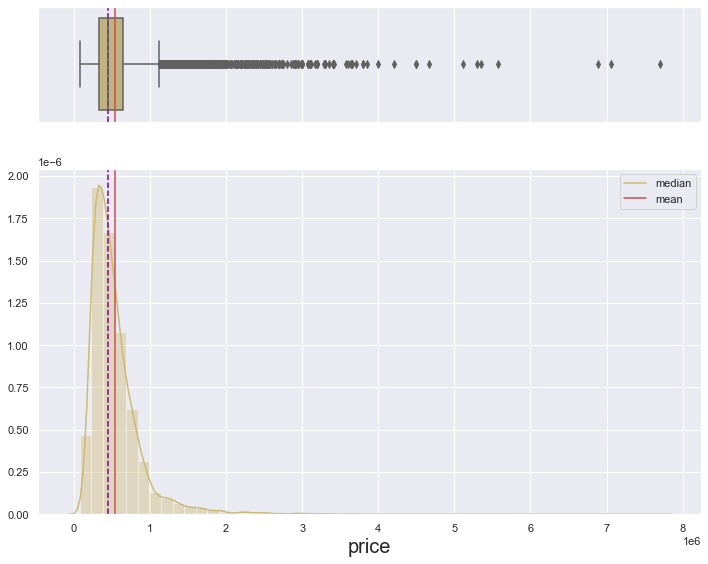

In [27]:
quantplot(df2.price)

### Observations
- The mean and median for price are \\$540,182.16 and \\$450,000 respectively.
- The distribution is extremely positively skewed.
- There are many extreme outliers, but nothing stands out that would make me believe they are typos, etc. Prices can vary greatly for housing.

## Living Measure

 The mean and median for living_measure are 2079.8607612520836 and 1910.0, respectively.
 There are 0 below the lower whisker and 569 above the upper whisker.


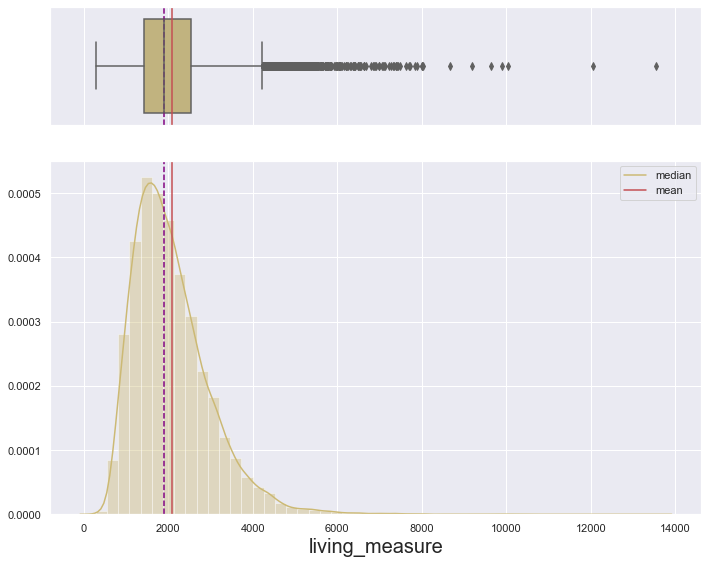

In [28]:
quantplot(df2.living_measure)

### Observations
- The mean and median for living_measure are 2079.89 and 1910 respectively.
- The distribution is positively skewed.
- There are some extreme outliers, but nothing that seems impossible for a house size.

## Lot Measure

 The mean and median for lot_measure are 15104.583283111586 and 7618.0, respectively.
 There are 0 below the lower whisker and 2405 above the upper whisker.


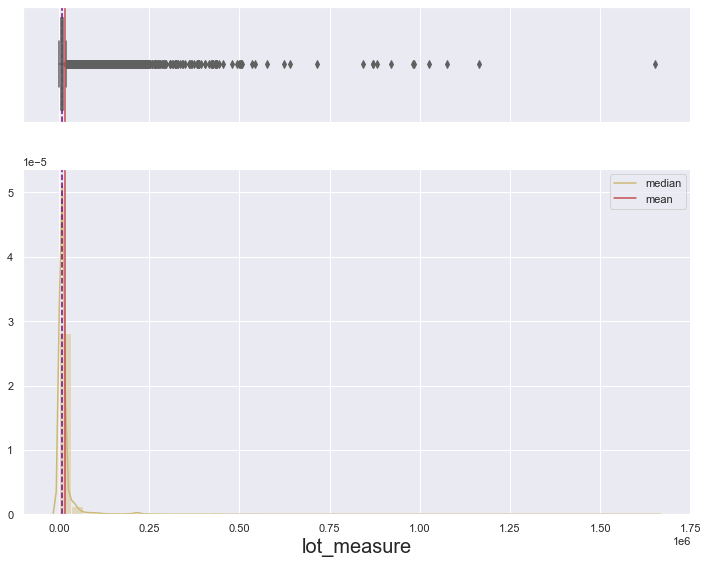

In [29]:
quantplot(df2.lot_measure)

### Observations
- The mean and median for lot_measure are 15104.08 and 7620, respectively.
- The distribution is extremely positively skewed.
- There are many extreme outliers, but I have no reason to suspect they are impossible values.

## Ceil Measure

 The mean and median for ceil_measure are 1788.3665556172498 and 1560.0, respectively.
 There are 0 below the lower whisker and 609 above the upper whisker.


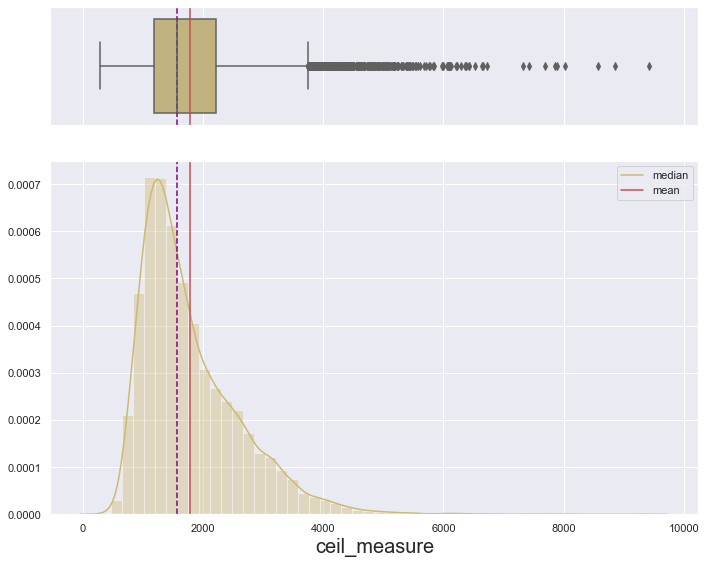

In [30]:
quantplot(df2.ceil_measure)

### Observations
- The mean and median for ceil_measure are 1788.37 and 1560, respectively.
- The distribution is positively skewed.
- There are some many extreme outliers, but nothing that seems impossible.

## Basement

 The mean and median for basement are 291.522533777531 and 0.0, respectively.
 There are 0 below the lower whisker and 492 above the upper whisker.


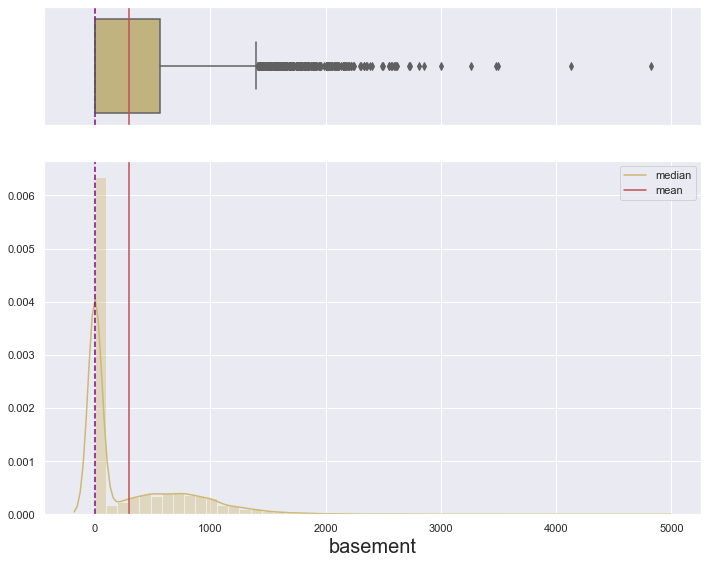

In [31]:
quantplot(df2.basement)

### Observations
- The mean and median for basement are 291.53 and 0, respectively.
- The distribution is extremely positively skewed.
- The variable is zero inflated and has many extreme values, but nothing that I identify as impossible.

### Living Measure 15

 The mean and median for living_measure15 are 1987.0655569543526 and 1840.0, respectively.
 There are 0 below the lower whisker and 539 above the upper whisker.


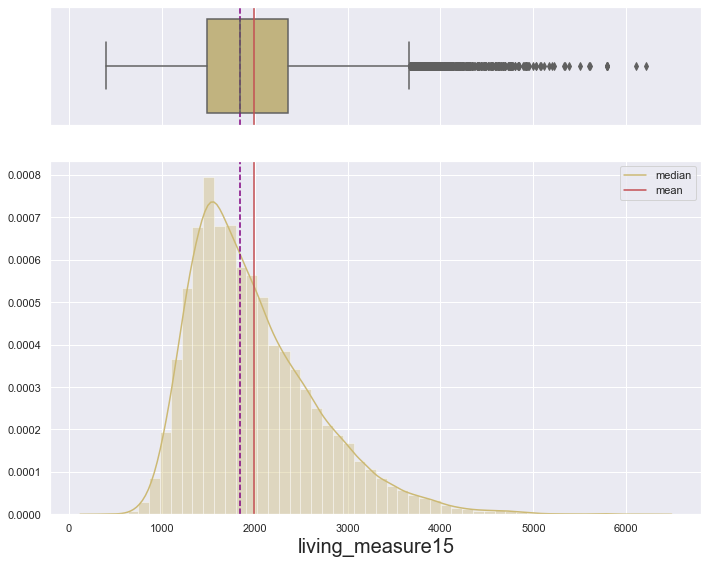

In [32]:
quantplot(df2.living_measure15)

### Observations
- The mean and median for living_measure15 are 1986.29 and 1840, respectively.
- The distribution is positively skewed.

## Lot Measure 15

 The mean and median for lot_measure15 are 12766.543180133433 and 7620.0, respectively.
 There are 0 below the lower whisker and 2181 above the upper whisker.


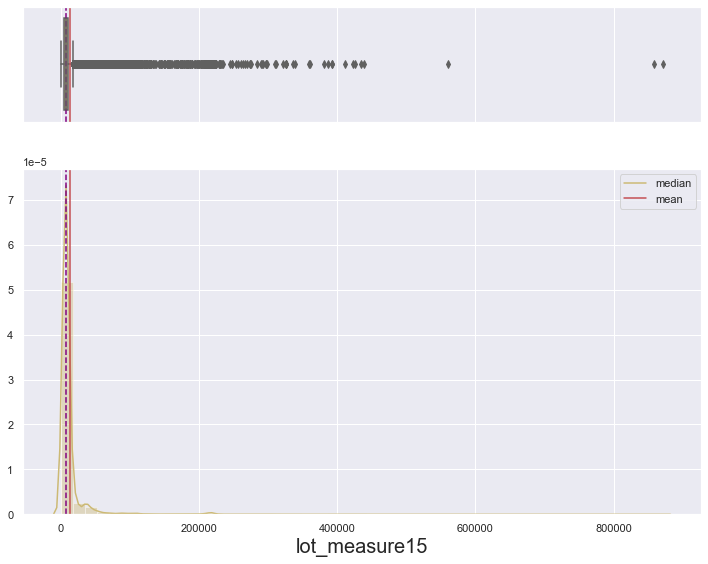

In [33]:
quantplot(df2.lot_measure15)

### Observations
- The mean and median for lot_measure15 are 12762.8 and 7620 respectively.
- The distribution is extremely positively skewed.
- There are many extreme outliers, but nothing that seems impossible.

## Total Area

 The mean and median for total_area are 17192.041633789744 and 9575.0, respectively.
 There are 0 below the lower whisker and 2398 above the upper whisker.


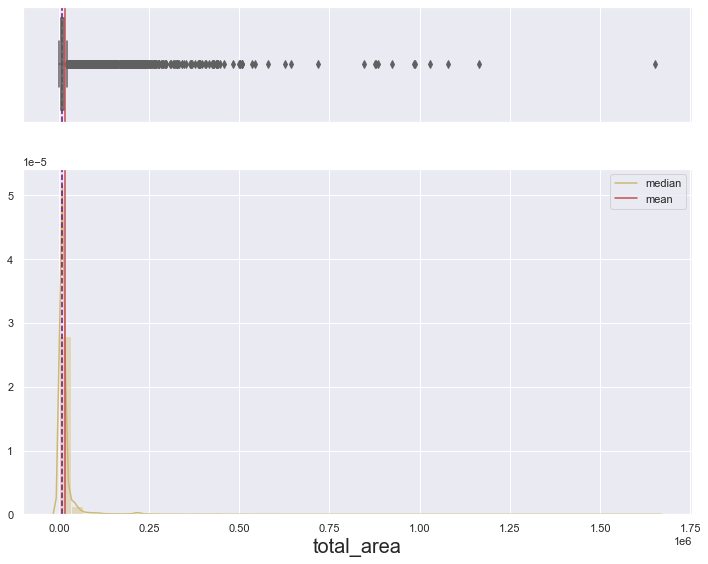

In [34]:
quantplot(df2.total_area)

### Observations
- The mean and median for total_area are 17178.26 and 9580 respectively.
- The distribution is heavily positively skewed.
- There are many extreme outliers, but there is nothing that seems impossible.

## Bedrooms

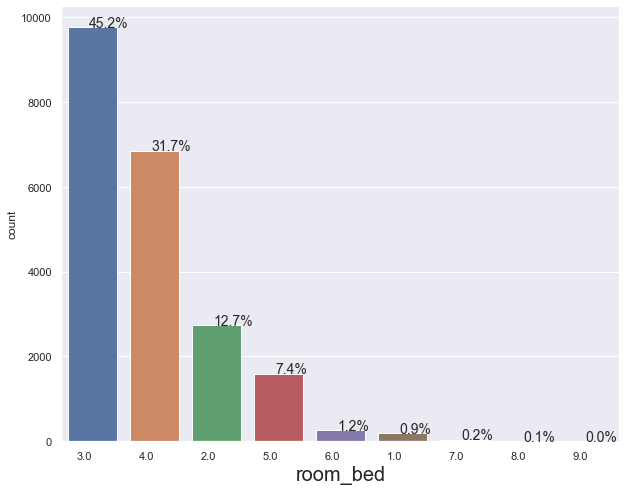

In [35]:
countplot(df2.room_bed, order = True)

### Observations
- 3 bedrooms was the most common value for bedrooms at 45% and followed by 4 bedrooms at 32%. 
- The count for the rest of the bedroom counts declines quickly after that.

## Bathrooms

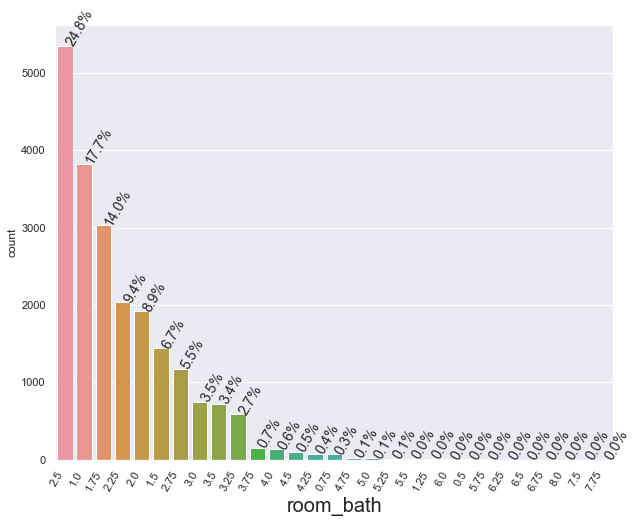

In [36]:
countplot(df2.room_bath, order = True, rotation = 60, rotation_perc = 60)

### Observations
- 2.5 bathrooms is the most common value for bathrooms at 25%, followed by 1 and 1.75 bathrooms after that at 17.8% and 14.1%, respectively.

## Year Built

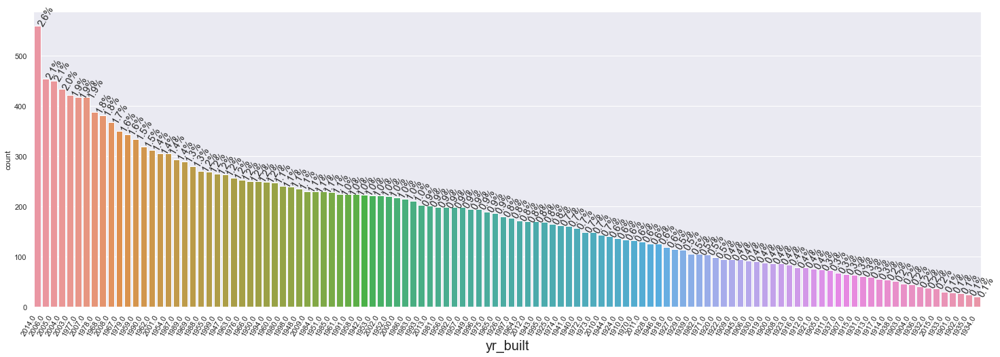

In [37]:
countplot(df2.yr_built, order = True, rotation = 60, rotation_perc = 60, figsize = (25, 8))

### Observations
- 2014 was the most common year a house was built at 2.6% of the data set.

I feel like data at this granular level is too chaotic. So I am creating a new variable that represents the decade that the house built.

## Decade Built

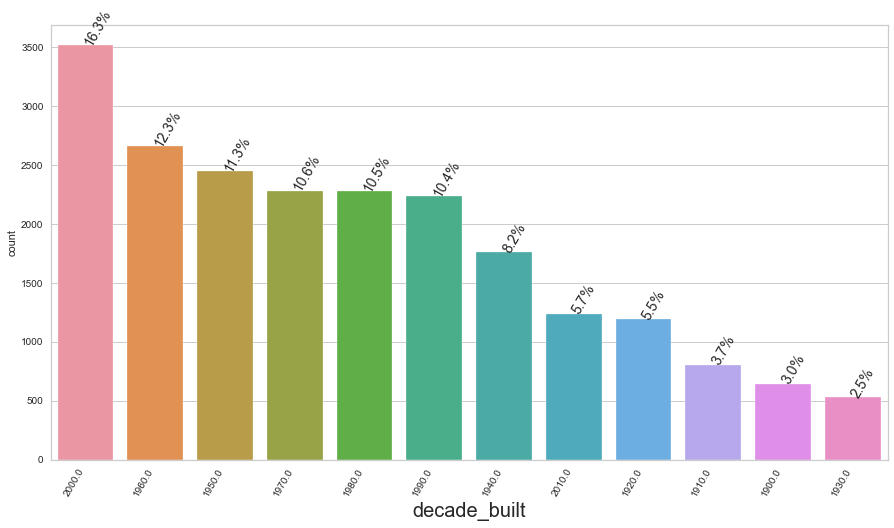

In [573]:
df2['decade_built'] = df2['yr_built'].apply(lambda x: x//10)*10
df2.loc[df2['yr_built'].isnull(), df2.columns.isin([f"decade_built"])] = np.nan
df2['decade_built'] = df2['decade_built'].astype('category')
countplot(df2['decade_built'], order = True, rotation = 60, rotation_perc = 60, figsize = (15, 8))

### Observations
- The 2000s was the largest decade for building homes in this dataset. Makes sense given the housing bubble. Even more so with the 2010's decade that followed the bubble bursting being so far down the list.

- The 1950s through 1990s have very similar representations in the data set with the 60's being a slightly better decade than the rest.

## Year Renovated

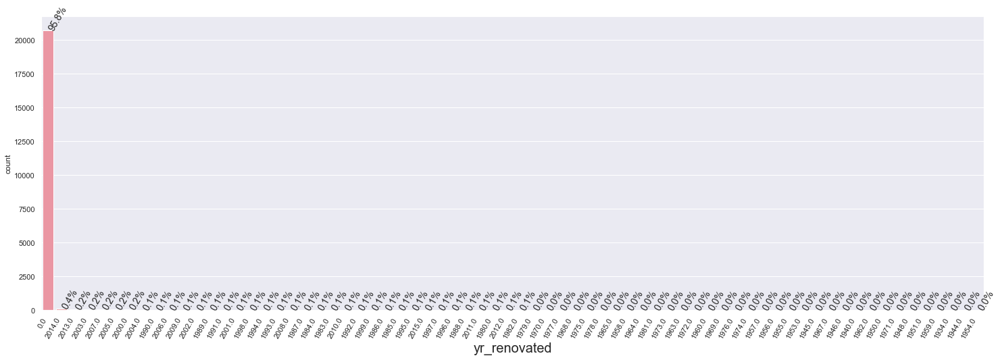

In [39]:
countplot(df2.yr_renovated, order = True, rotation = 60, rotation_perc = 60, figsize = (25, 8))

### Observations
- Year Renovated is definitely zero inflated and that seems reasonable.

Again, I am going to create another decade variable for renovations

## Decade Renovated

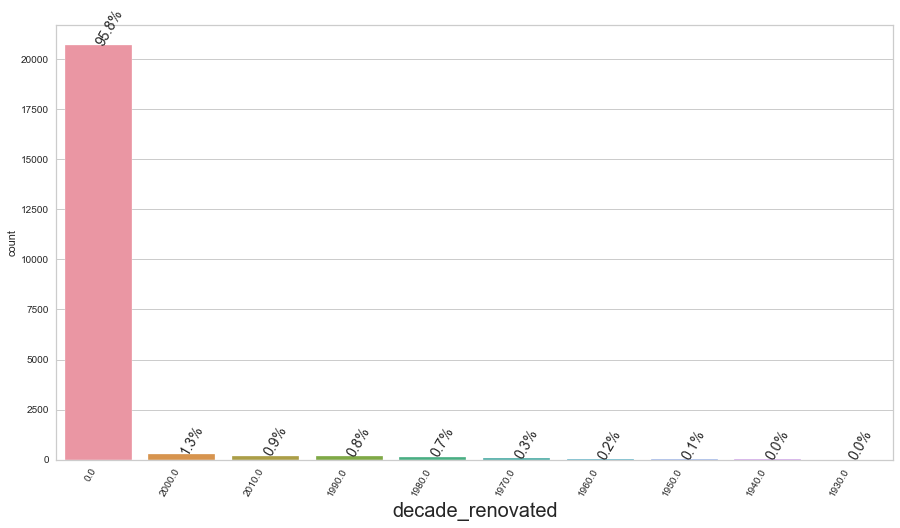

In [574]:
df2['decade_renovated'] = df2.yr_renovated.apply(lambda x: x//10)*10
df2['decade_renovated'] = df2['decade_renovated'].astype('category')
df2.loc[df2['yr_renovated'].isnull(), df2.columns.isin([f"decade_renovated"])] = np.nan
countplot(df2['decade_renovated'], order = True, rotation = 60, rotation_perc = 60, figsize = (15, 8)) 

### Observations
- Aside from those not being renovated, overwhelming remaining majority were renovated between the 1980s and 2000s inclusively. - And these decades were very similar in shares of the data.

## Ceil

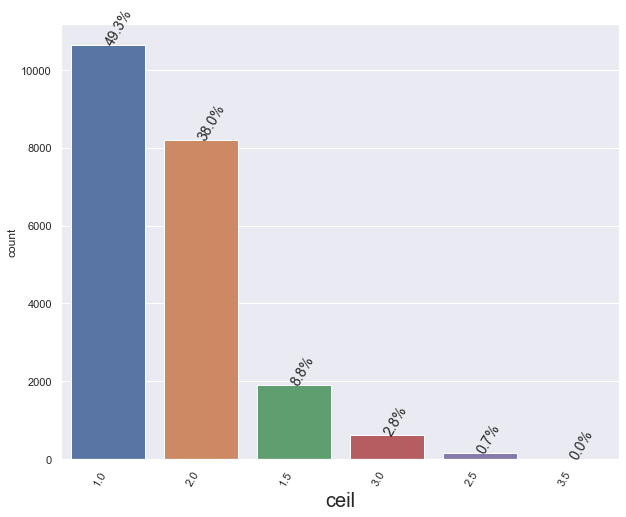

In [41]:
countplot(df2.ceil, order = True, rotation = 60, rotation_perc = 60)

### Observations
- Almost half of houses were single floor and were the majority case.
- 2 floors came in a close second and followed by 3 floors that made up only 3% of the data.

### Coast

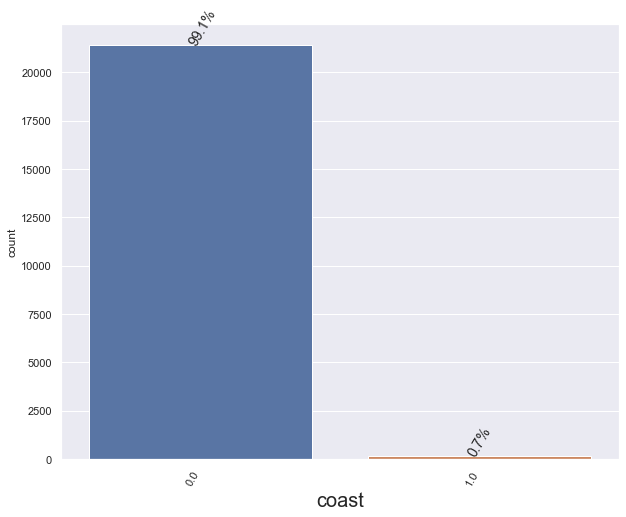

In [42]:
countplot(df2.coast, order = True, rotation = 60, rotation_perc = 60)

### Observations
- As one would expect, very few houses in the dataset had a coastal view at less than 1% of the data.

## Sight

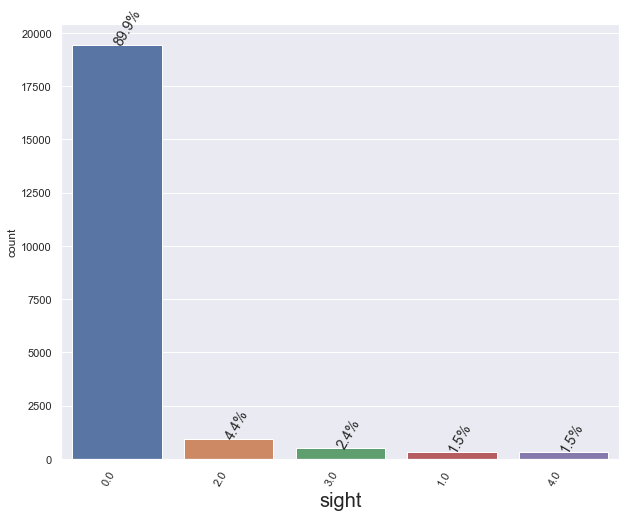

In [43]:
countplot(df2.sight, order = True, rotation = 60, rotation_perc = 60)

### Observations
- The data is zero inflated. Of those viewed, the being viewed 2 times had the highest count.

## Condition

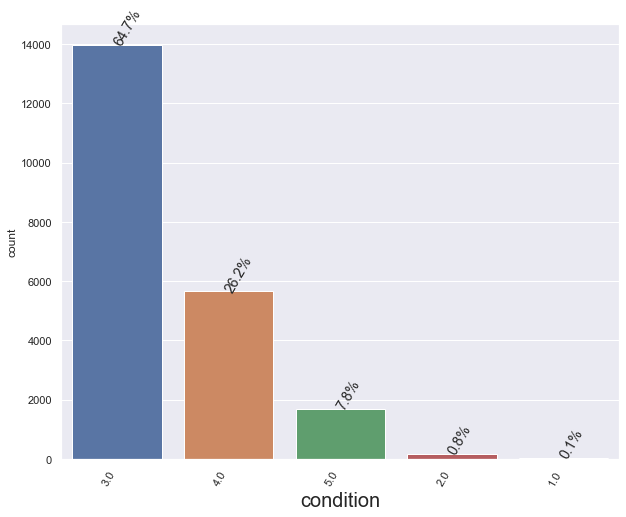

In [44]:
countplot(df2.condition, order = True, rotation = 60, rotation_perc = 60)

### Observations
- The majority of houses had a condition of 3 at 65%.
- The majority was followed by conditions of 4 and 5 with 26.3% and 7.8%, respectively.

## Zipcode

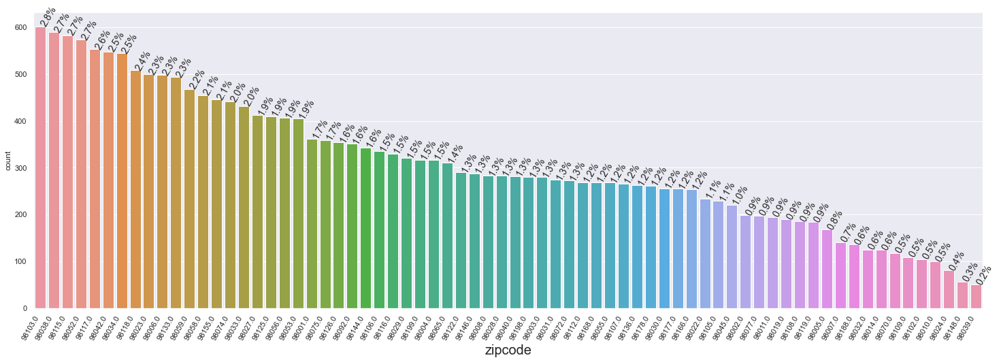

In [45]:
countplot(df2.zipcode, order = True, rotation = 60, rotation_perc = 60, figsize = (25, 8))

## Zipcode2

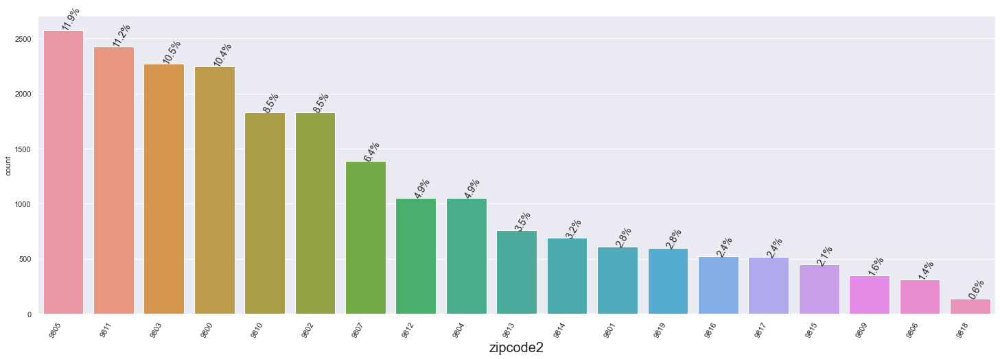

In [46]:
countplot(df2.zipcode2, order = True, rotation = 60, rotation_perc = 60, figsize = (25, 8))

### Observations
- 9805 is the largest goup of zipcodes at 11.9% and followed by 9811 at a close second 11.2%.
- 9818 is the smalled group of zipcodes at 0.6%.

## Quality

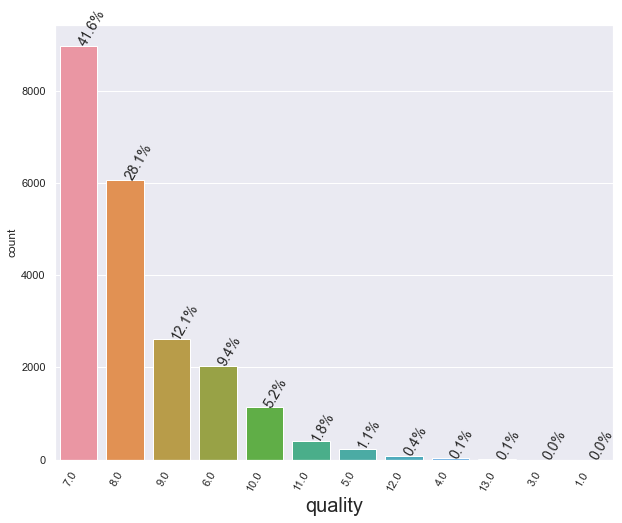

In [47]:
countplot(df2.quality, order = True, rotation = 60, rotation_perc = 60)

### Observations
- 41.6% of houses in the data had a quality of 7. This high is followed by quality of 8 with 28.1%.
- Less than 1% had a quality value lower than 5 or higher than 11.

## Furnished

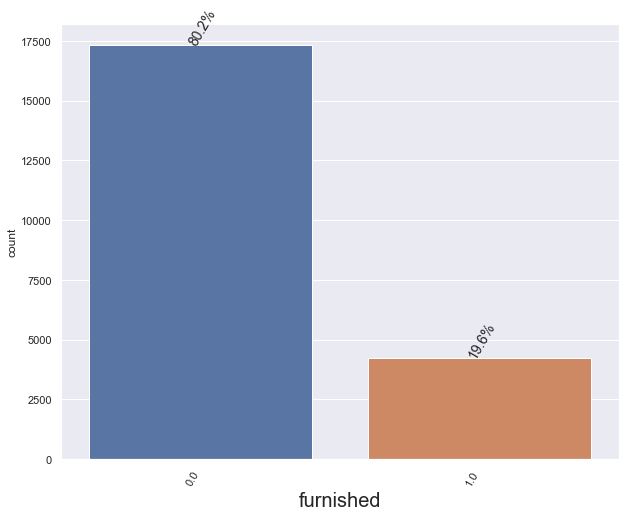

In [48]:
countplot(df2.furnished, order = True, rotation = 60, rotation_perc = 60)

### Observations
- Most houses (80%) were not furnished.

## Year House was Sold

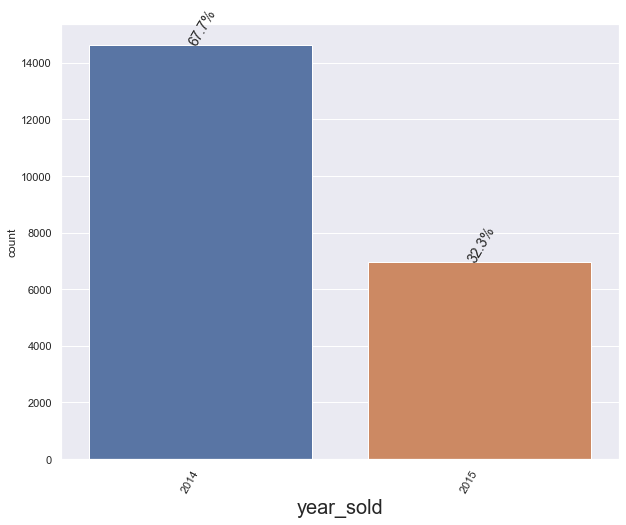

In [49]:
countplot(df2.year_sold, order = True, rotation = 60, rotation_perc = 60)

### Observations
- 68% of the houses were sold in 2014, while the rest were sold in 2015.

## Months House was Sold

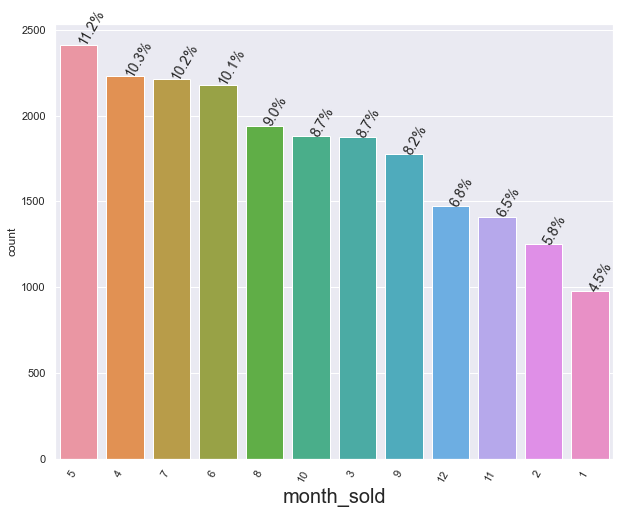

In [50]:
countplot(df2.month_sold, order = True, rotation = 60, rotation_perc = 60)

### Observations
- May had the highest frequency of sales, and was followed by April, July, and June with all that were approximately tied.
- The coldest months in the United States, from November to February, had the lowest count of sales.

# Multivariate Analysis

In [51]:
continuous_col = list(df2.select_dtypes(exclude=['category']).columns)

<AxesSubplot:>

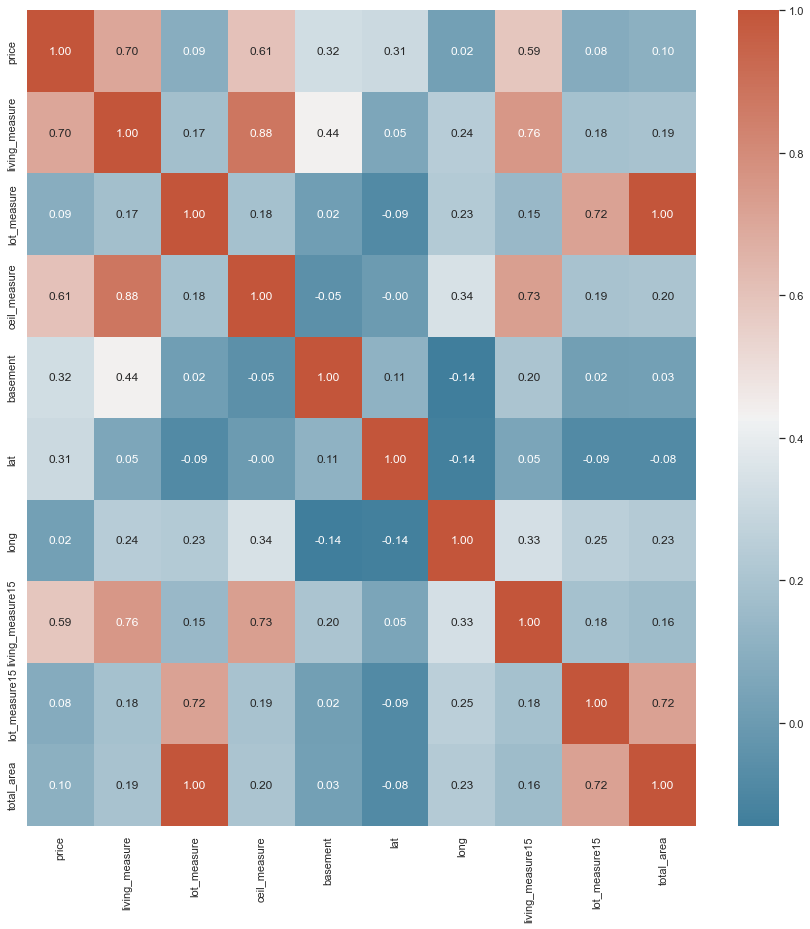

In [52]:
plt.subplots(figsize=(15,15))
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(df[continuous_col].corr().transpose(),cmap=cmap, fmt=".2f",annot=True)

### Observations
- lot_measure and total_area share a perfect correlation. I will have to drop one of these. I will drop total_area since it is the sum of both living and lot measure.
- Aside from the above, living_measure and ceil_measure share the strongest correlation of 0.88. This is the only pair of variables that cause me ot worry about potential multicolinearity. There are pairs that have significant correlation, but this appears to be the only one near the danger zone of 0.9.
- living_measure and its complement living_measure15 both share significant positive correlations with each other and ceil measure.
- lot_measure and and its complement lot_measure15 also share a significant positive correlation.
- price is significantly correlated with living_measure, ceil_measure, and living_measure15.

## Pairplot

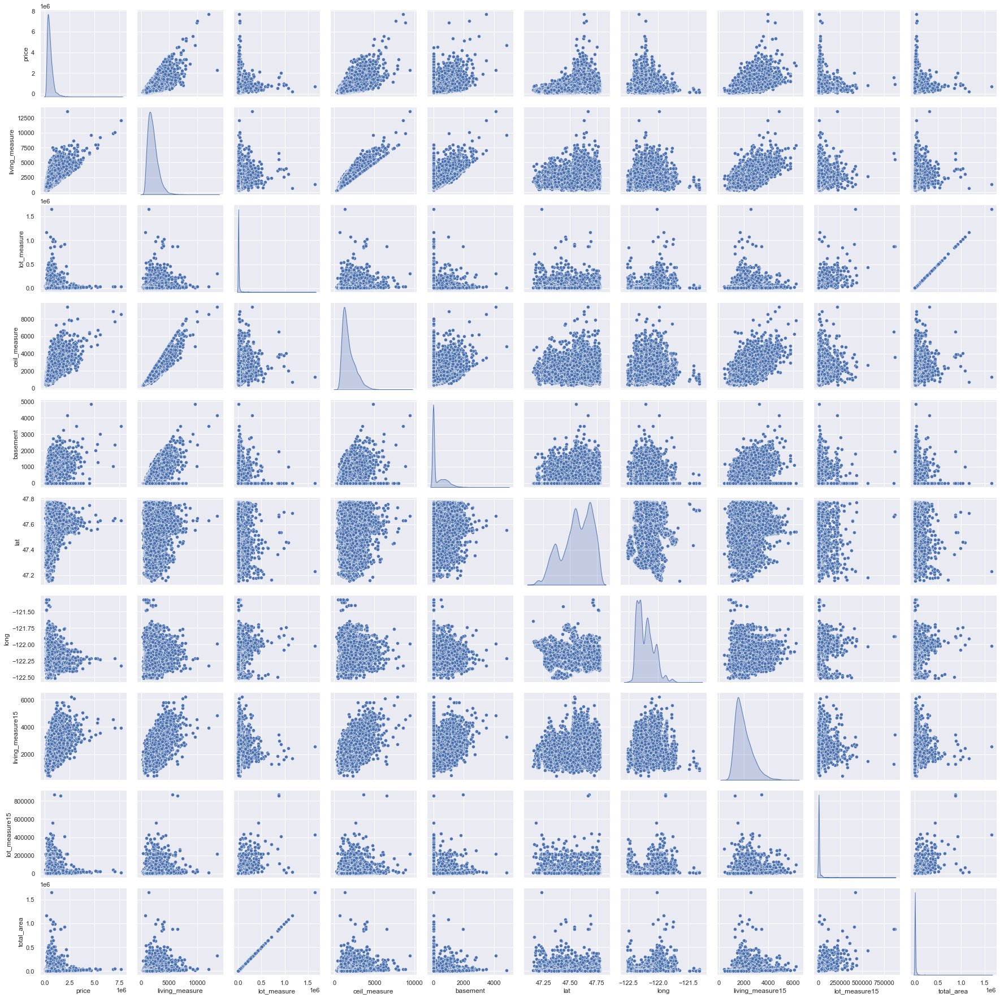

In [53]:
sns.pairplot(df2[continuous_col],diag_kind="kde")

### Observations
- The variance of price increases as living_measure, lot_measure, living_measure15, lot_measure15, lat, and basement increase.
- The variance of basement increases as price, living_measure, ceil_measure.

## Pairplot broken down by furnished

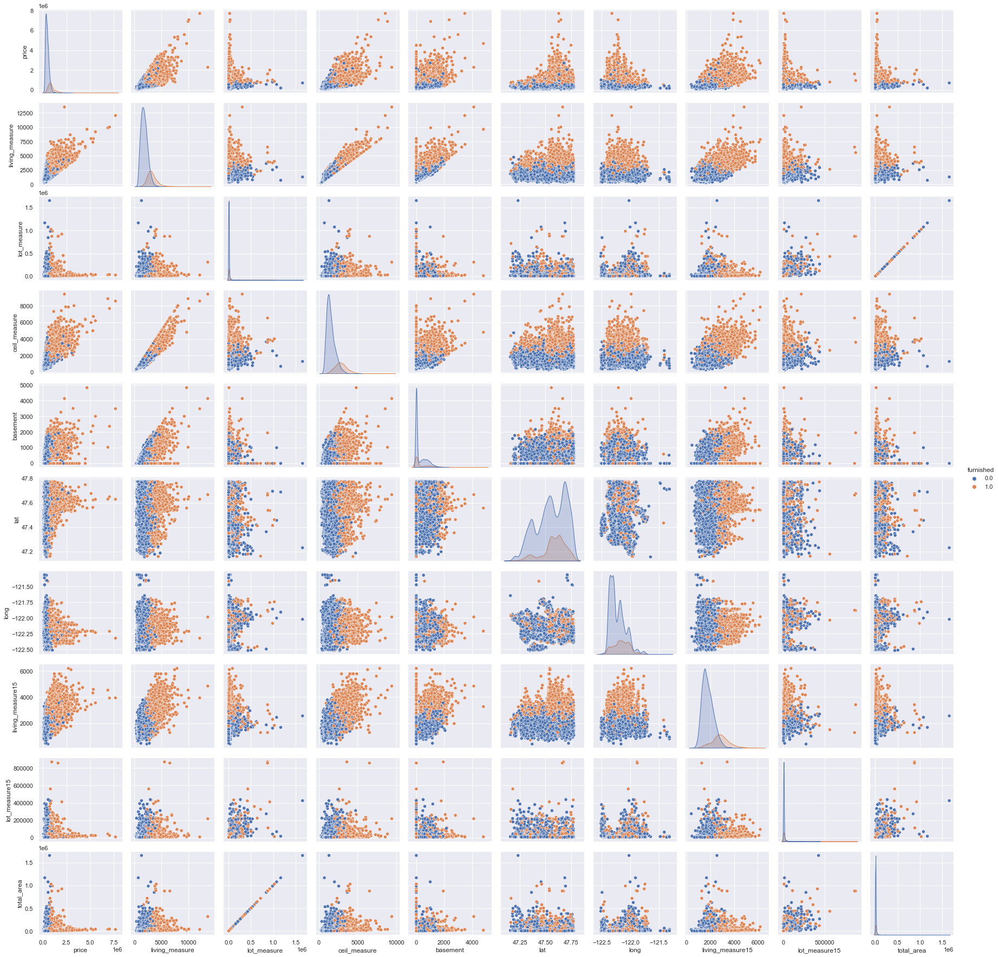

In [56]:
continuous_col.append('furnished')
sns.pairplot(df2[continuous_col],diag_kind="kde", hue = 'furnished')
continuous_col.remove('furnished')

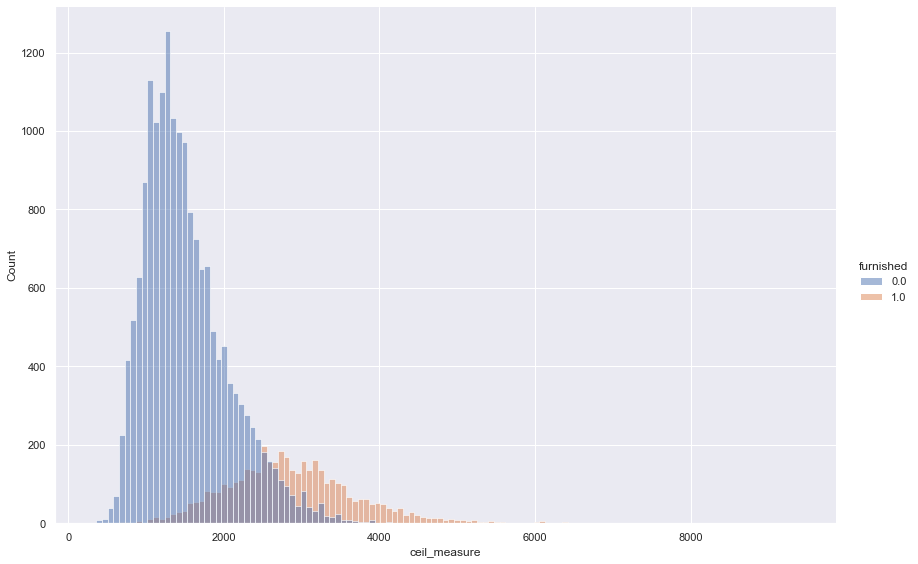

In [57]:
sns.displot(data=df2, x='ceil_measure', hue='furnished', height=8, aspect=1.5)

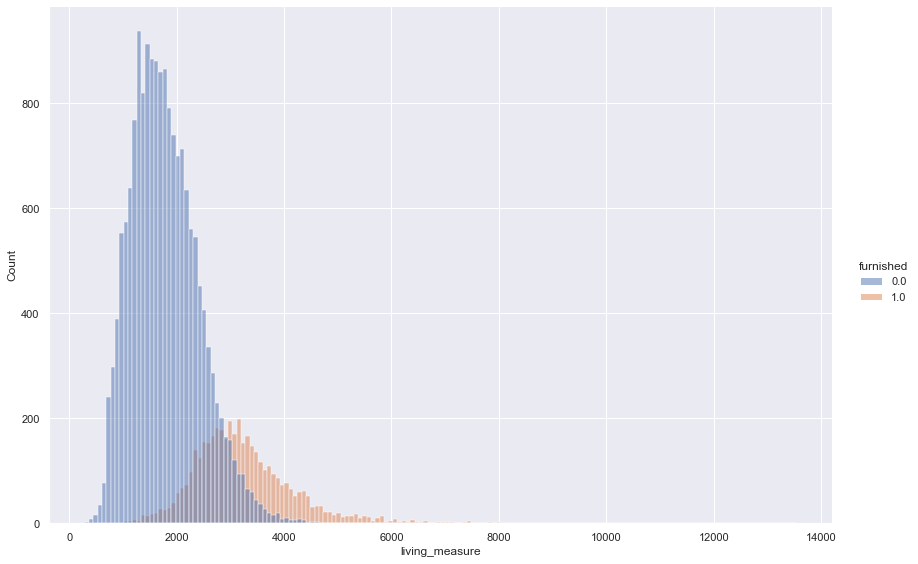

In [58]:
sns.displot(data=df2, x='living_measure', hue='furnished', height=8, aspect=1.5)

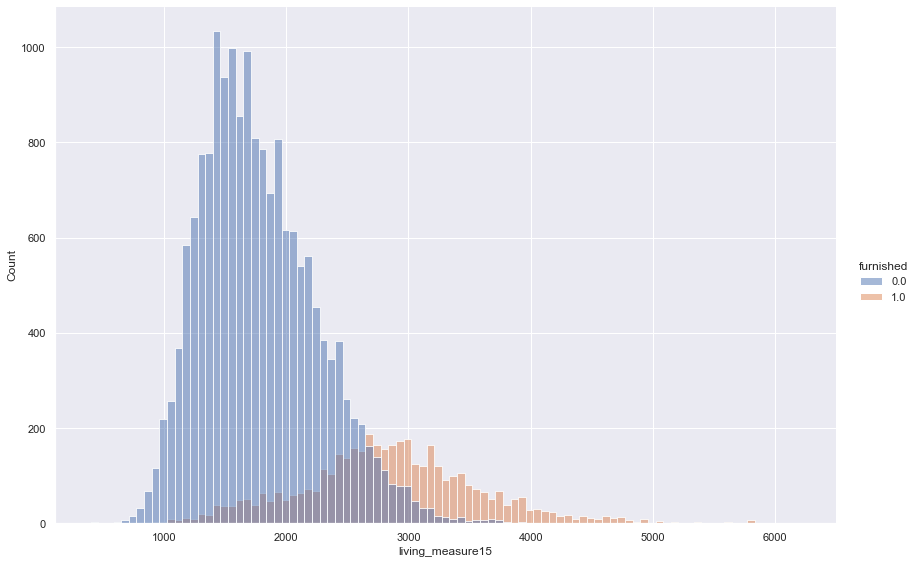

In [59]:
sns.displot(data=df2, x='living_measure15', hue='furnished', height=8, aspect=1.5)

### Observations
- Furnished houses show clear distinction from its counter part in many of the pair plots. Furnished houses are more common among houses with higher values in prices, both living measure values, ceil measure, and basement variables.
- The distributions for each furnished subgroup differ in variance for ceil_measure and the living measures distribution plots. I will create interaction variables for these.

## Pairplot broken down by ceil

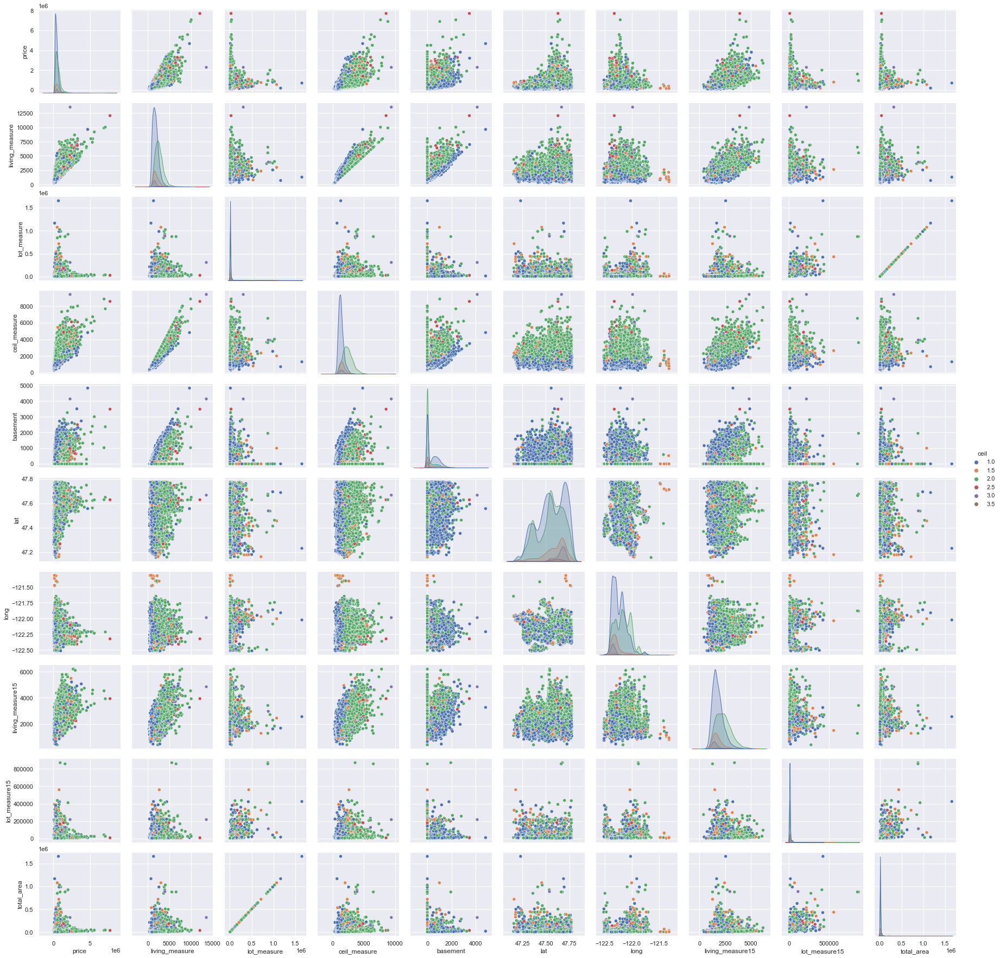

In [62]:
continuous_col.append('ceil')
sns.pairplot(df2[continuous_col],diag_kind="kde", hue = 'ceil')
continuous_col.remove('ceil')

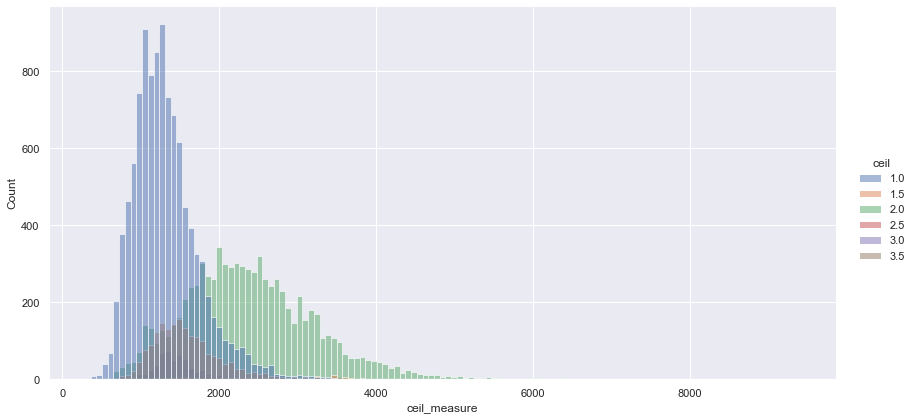

In [63]:
sns.displot(data=df2, x='ceil_measure', hue='ceil', height=6, aspect=2)

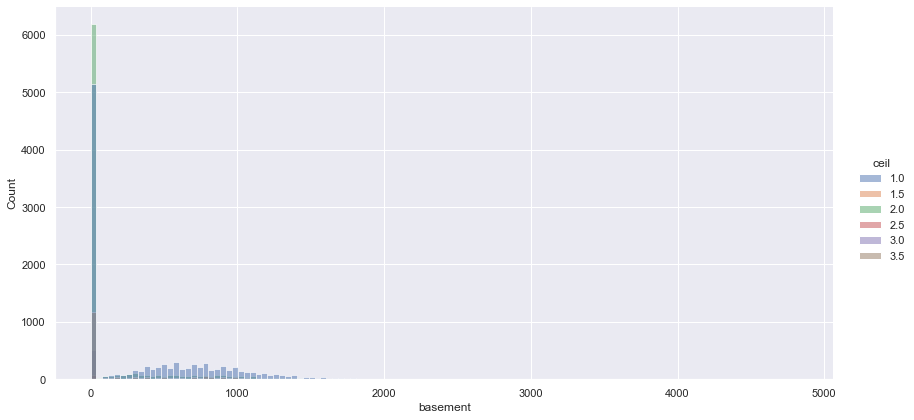

In [64]:
sns.displot(data=df2, x='basement', hue='ceil', height=6, aspect=2)

### Observations
- 2 floors are associated with higher values for ceil measure, and both living measures.
- The distributions of ceil_measure for 2 floor houses and basement for 1 floor houses differs from the rest of the houses with different number of floors. I will create interaction variables for these two subgroups.

## Pairplot broken down by year sold

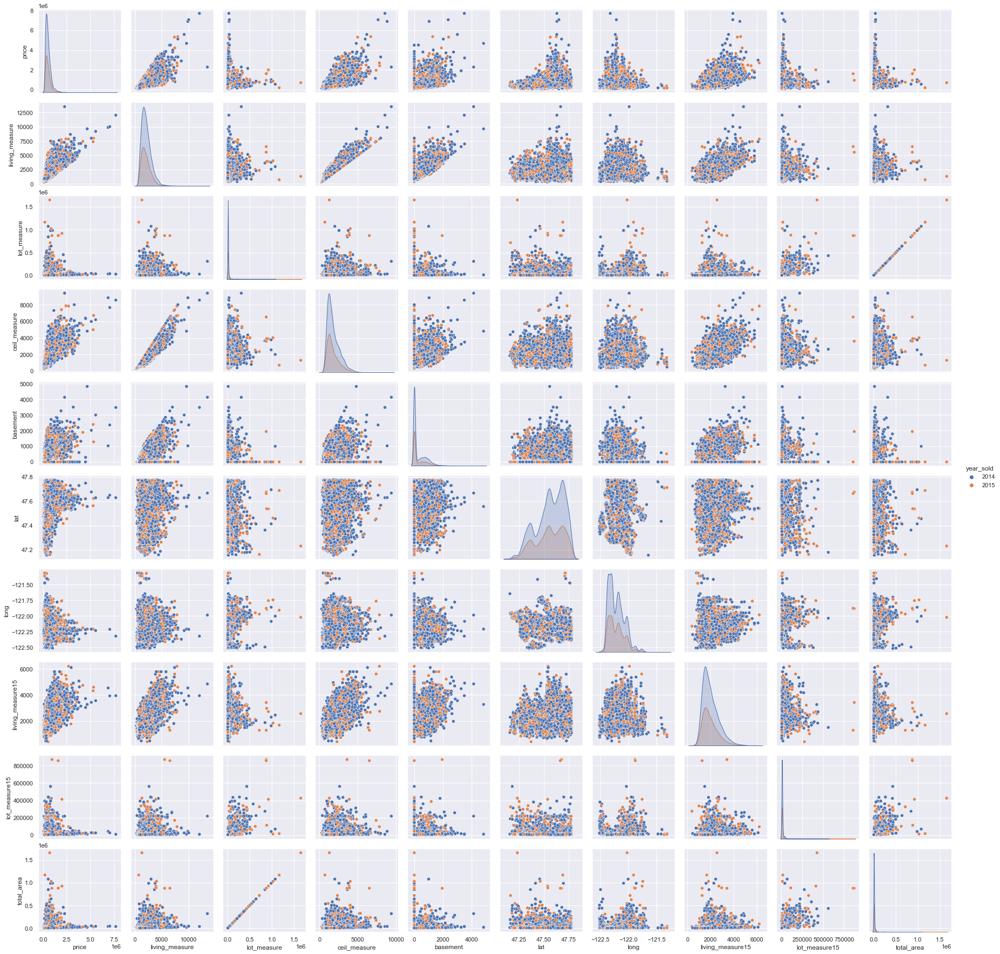

In [66]:
continuous_col.append('year_sold')
sns.pairplot(df2[continuous_col],diag_kind="kde", hue = 'year_sold')
continuous_col.remove('year_sold')

### Observations
- While there visually appears to be a clear clustering of 2015 houses from 2014 houses, I believe that 2015 houses are just being plotted above the 2014 houses. I believe this since there are so much more 2014 houses than 2015 houses in the data, but you would think 2014 houses are more rare if you went off the pair plots.

## Pairplot broken down by quality

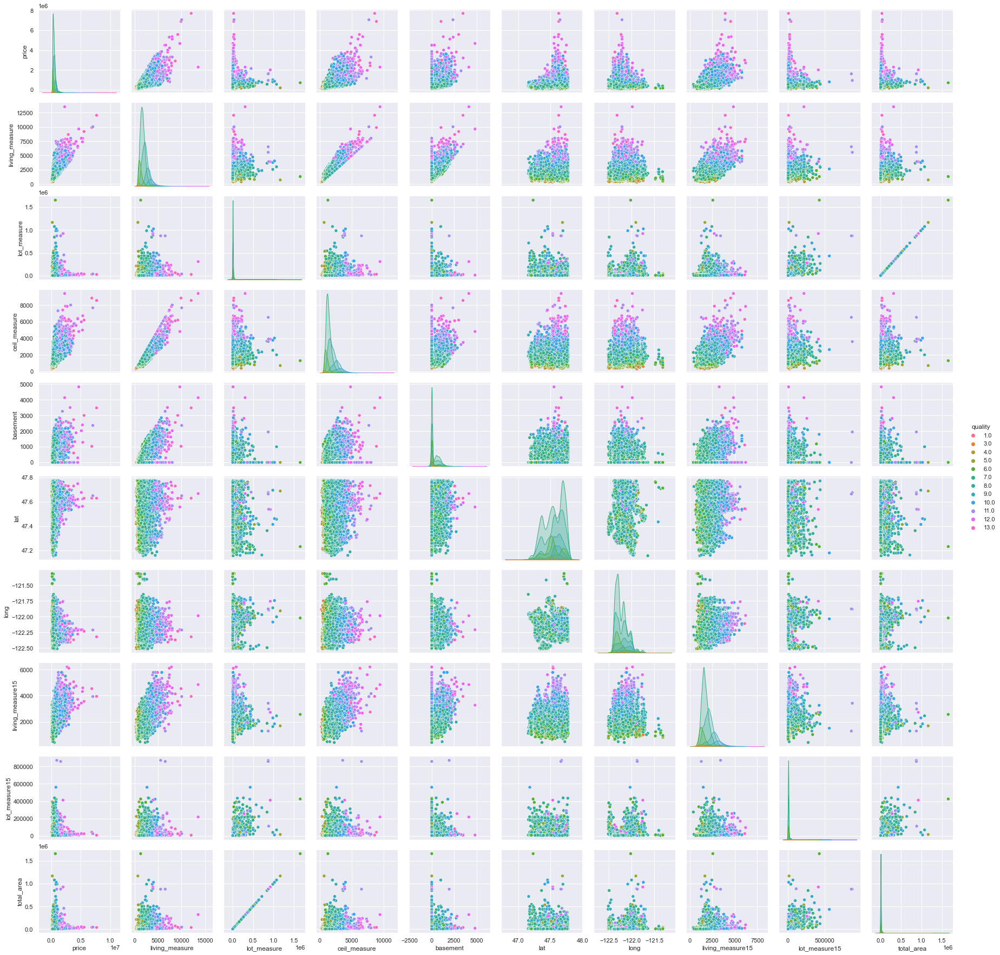

In [69]:
continuous_col.append('quality')
sns.pairplot(df2[continuous_col],diag_kind="kde", hue = 'quality')
continuous_col.remove('quality')

### Observations
- price, living_measure, living_measure15, ceil_measure, lat, long, and basement show patterns of higher values in these variables being associated higher quality.

## Cramer's V for Categorical Variables

In [70]:
def cramers_V(var1,var2) :
  crosstab =np.array(pd.crosstab(var1,var2, rownames=None, colnames=None)) # Cross table building
  stat = chi2_contingency(crosstab)[0] # Keeping of the test statistic of the Chi2 test
  obs = np.sum(crosstab) # Number of observations
  mini = min(crosstab.shape)-1 # Take the minimum value between the columns and the rows of the cross table
  return (stat/(obs*mini))

In [71]:
from sklearn import preprocessing
data = df2[cat]
label = preprocessing.LabelEncoder()
data_encoded = pd.DataFrame() 

for i in data.columns :
  data_encoded[i]=label.fit_transform(data[i])

data_encoded.head()

rows= []

for var1 in data_encoded:
  col = []
  for var2 in data_encoded :
    cramers =cramers_V(data_encoded[var1], data_encoded[var2]) # Cramer's V test
    col.append(round(cramers,2)) # Keeping of the rounded value of the Cramer's V  
  rows.append(col)
  
cramers_results = np.array(rows)
cramer_v_df = pd.DataFrame(cramers_results, columns = data_encoded.columns, index =data_encoded.columns)

cramer_v_df

,room_bed,room_bath,yr_built,yr_renovated,ceil,coast,sight,condition,zipcode,zipcode2,quality,furnished,month_sold,year_sold
room_bed,1.000,0.180,0.040,0.010,0.020,0.000,0.010,0.030,0.020,0.010,0.030,0.040,0.000,0.000
room_bath,0.180,1.000,0.030,0.010,0.080,0.010,0.020,0.050,0.010,0.010,0.100,0.140,0.000,0.000
yr_built,0.040,0.030,1.000,0.010,0.140,0.010,0.010,0.060,0.020,0.040,0.050,0.080,0.010,0.010
yr_renovated,0.010,0.010,0.010,1.000,0.000,0.020,0.010,0.000,0.000,0.000,0.000,0.000,0.000,0.000
ceil,0.020,0.080,0.140,0.000,1.000,0.220,0.000,0.030,0.060,0.030,0.050,0.080,0.000,0.000
coast,0.000,0.010,0.010,0.020,0.220,1.000,0.180,0.000,0.020,0.000,0.020,0.000,0.000,0.000
sight,0.010,0.020,0.010,0.010,0.000,0.180,1.000,0.130,0.020,0.010,0.020,0.020,0.000,0.000
condition,0.030,0.050,0.060,0.000,0.030,0.000,0.130,1.000,0.020,0.010,0.020,0.010,0.000,0.000
zipcode,0.020,0.010,0.020,0.000,0.060,0.020,0.020,0.020,1.000,1.000,0.040,0.080,0.000,0.010
zipcode2,0.010,0.010,0.040,0.000,0.030,0.000,0.010,0.010,1.000,1.000,0.010,0.030,0.000,0.000


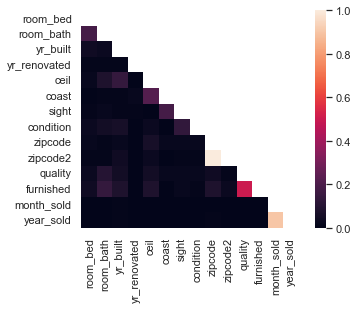

In [72]:
# Heat map of the table Cramer V table
mask = np.zeros_like(cramer_v_df, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

with sns.axes_style("white"):
  ax = sns.heatmap(cramer_v_df, mask=mask,vmin=0., vmax=1, square=True)

plt.show()

### Observations
- There are no strong relationships among the categorical variables aside from month & year sold and the zipcode variables paired with each other.

# Multivariate Analysis

## Price by Bedroom

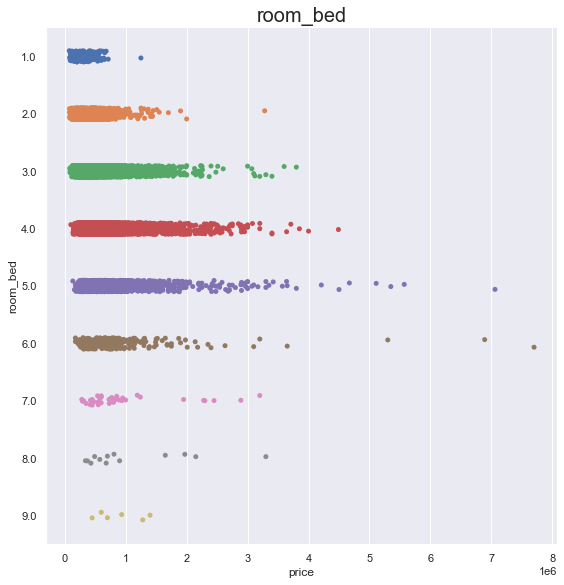

In [82]:
col = 0
#Categorical scatter plot
sns.catplot(x='price',y=cat[col],data=df2, height=8, aspect=1)
plt.title(f"{cat[col]}", fontsize=20)
col+=1

### Observations
- The first half of the chart show that higher prices were associated with more bedrooms, as one would expect. However, this trend reverses after six bedrooms.
- That houses with 7 bedrooms are more are so relatively cheap is suspect. Are these typos as well? Or are all these houses with so many bedrooms in very rural locations are in a very impoverished side of a city?

## Price by Bathroom

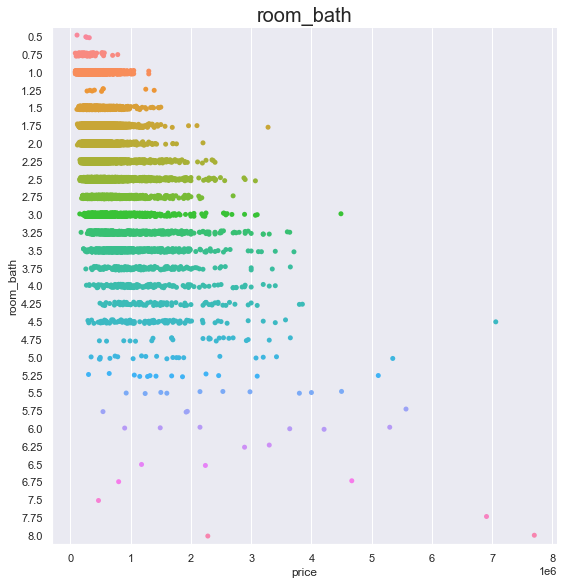

In [83]:
#Categorical scatter plot
sns.catplot(x='price',y=cat[col],data=df2, height=8, aspect=1)
plt.title(f"{cat[col]}", fontsize=20)
col+=1

### Observations
- Higher prices tend to be more associated with more bathrooms.
- Surprising that there are houses with many bathrooms that are still cheap just as with bedrooms above.

## Price by Year House was Built

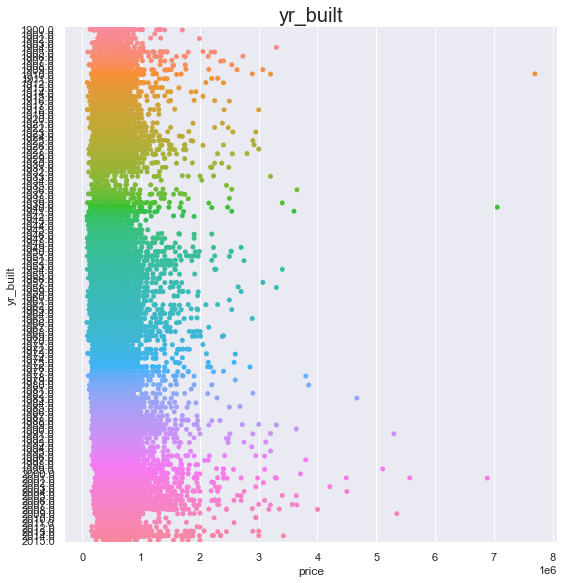

In [84]:
#Categorical scatter plot
sns.catplot(x='price',y=cat[col],data=df2, height=8, aspect=1)
plt.title(f"{cat[col]}", fontsize=20)
col+=1

### Observations
- The higher prices tend be associated more with houses built more recently, aside from a few outliers.

## Price by Year House was Renovated

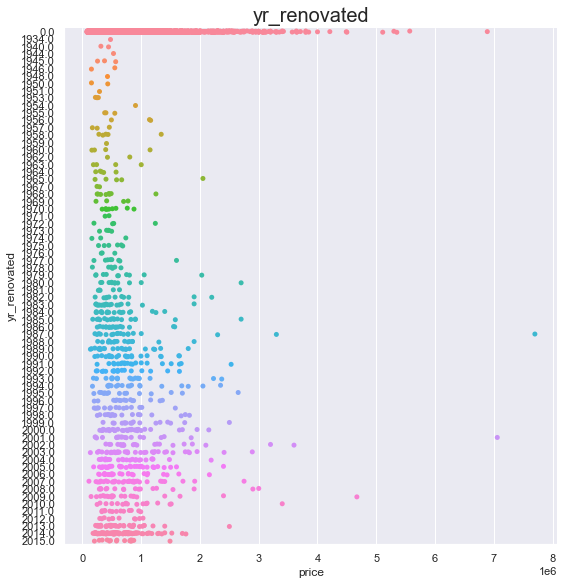

In [85]:
#Categorical scatter plot
sns.catplot(x='price',y=cat[col],data=df2, height=8, aspect=1)
plt.title(f"{cat[col]}", fontsize=20)
col+=1

### Observations
- Focusing on only the houses that have been renovated, higher prices tend to be associated with the houses that have been renovated more recently.

## Price by Ceil

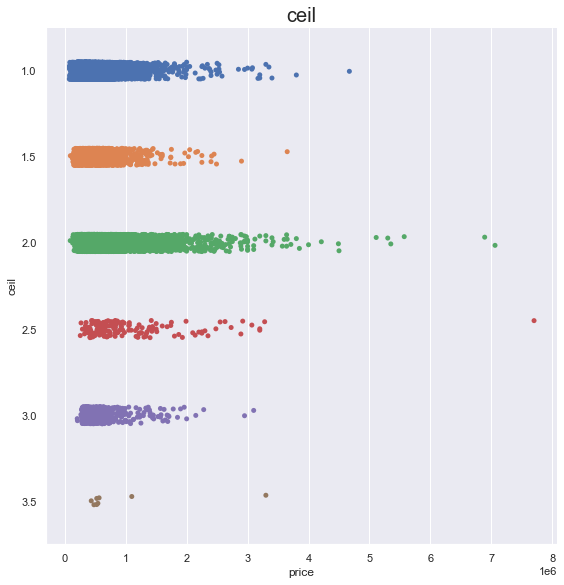

In [86]:
#Categorical scatter plot
sns.catplot(x='price',y=cat[col],data=df2, height=8, aspect=1)
plt.title(f"{cat[col]}", fontsize=20)
col+=1

### Observations
- As expected, higher prices are are associated with two floors more than having only one floor.
- Surprising that 3 floors are so relatively cheap. I am guessing that they are mostly rural.

## Price by Coast

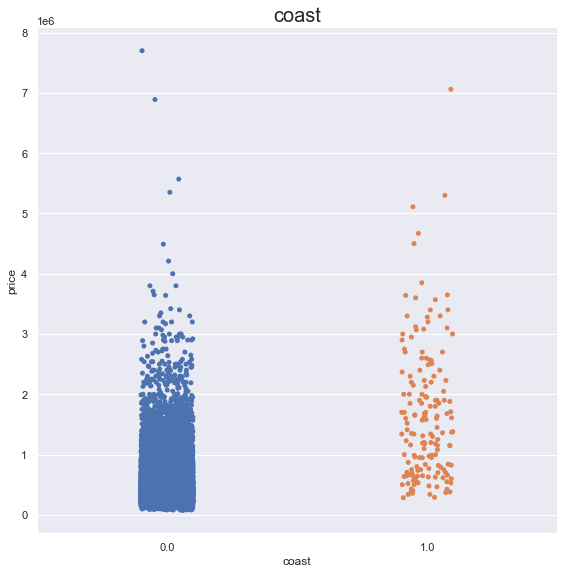

In [87]:
#Categorical scatter plot
sns.catplot(y='price',x=cat[col],data=df2, height=8, aspect=1)
plt.title(f"{cat[col]}", fontsize=20)
col+=1

### Observations
- Nothing stands out here.

## Price by Sight

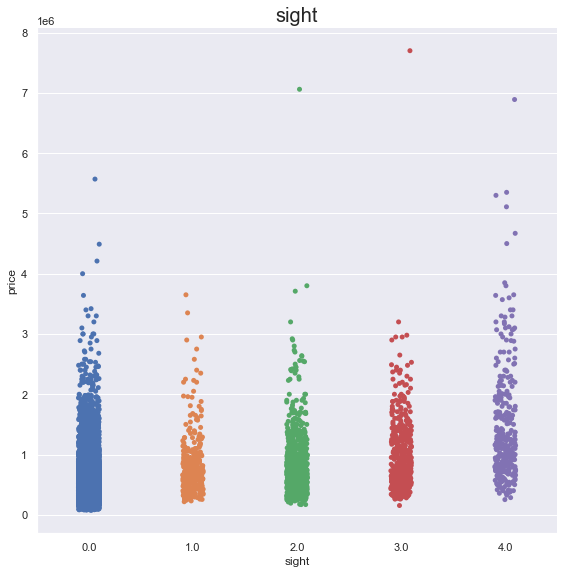

In [88]:
#Categorical scatter plot
sns.catplot(y='price',x=cat[col],data=df2, height=8, aspect=1)
plt.title(f"{cat[col]}", fontsize=20)
col+=1

### Observations
- Given that the data is zeron inflated, I think the only noticeable thing here is that higher priced homes have likely been sighted four times.

## Price by Condition

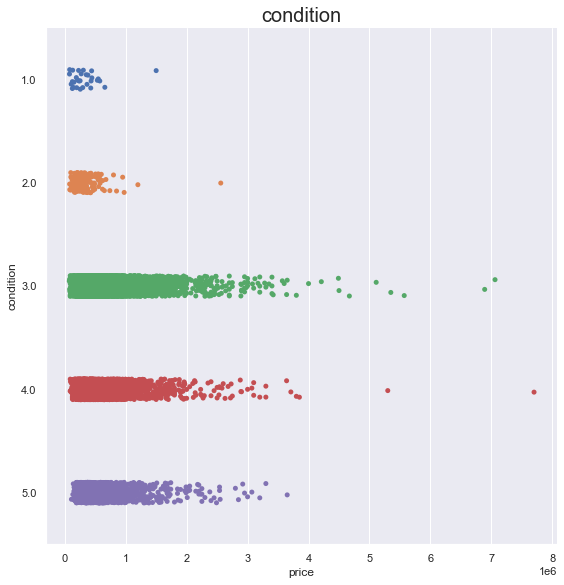

In [89]:
#Categorical scatter plot
sns.catplot(x='price',y=cat[col],data=df2, height=8, aspect=1)
plt.title(f"{cat[col]}", fontsize=20)
col+=1

### Observations
- The houses in better condition are worth more than those in poorer condition.

## Price by Zipcode

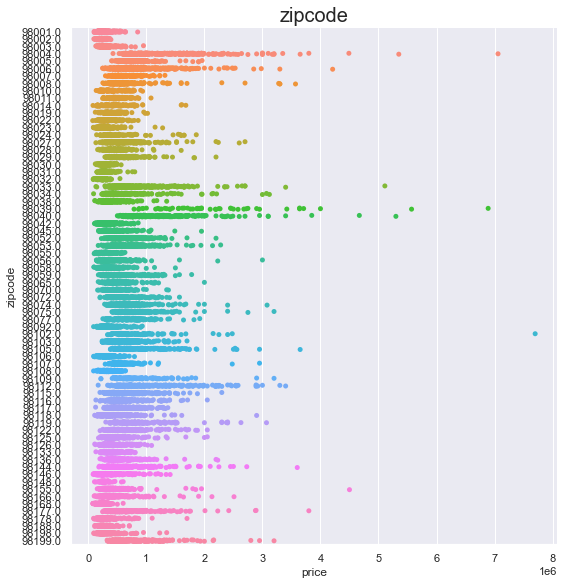

In [90]:
#Categorical scatter plot
sns.catplot(x='price',y=cat[col],data=df2, height=8, aspect=1)
plt.title(f"{cat[col]}", fontsize=20)
col+=1

### Observations
- 98004, 98039, and 98040 zipcodes hold the most extreme values in house prices.
- 98102 has the highest price house.

## Price by Zipcode2

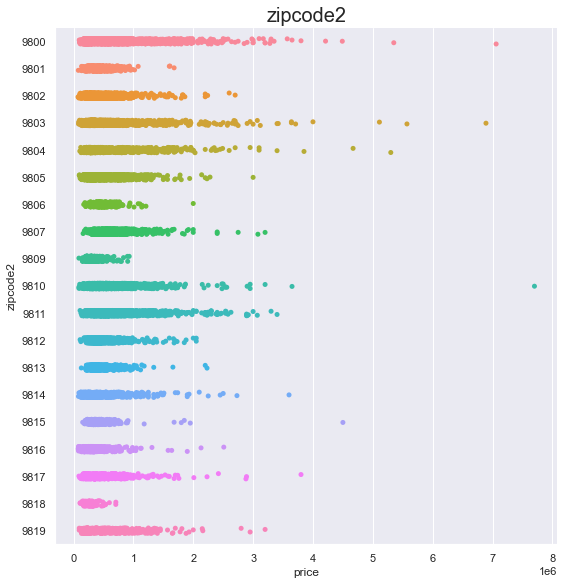

In [91]:
#Categorical scatter plot
sns.catplot(x='price',y=cat[col],data=df2, height=8, aspect=1)
plt.title(f"{cat[col]}", fontsize=20)
col+=1

### Observations
- Groups 9800, 9803, and 9804 have most of the extreme values.
- Group 9810 has the highest priced house.

## Price by Quality

Text(0.5, 1.0, 'quality')

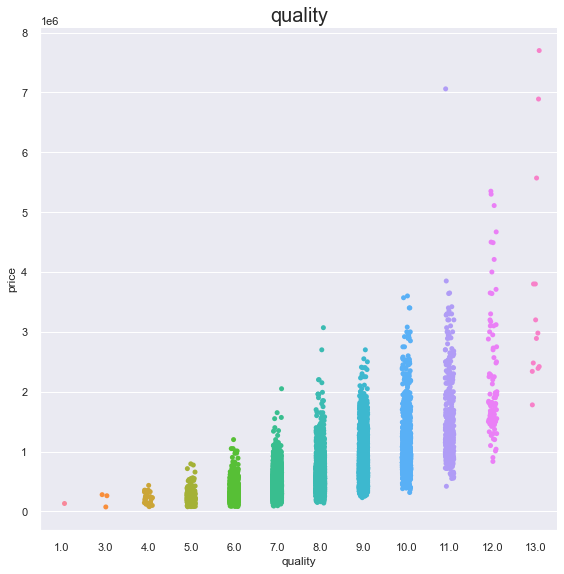

In [604]:
#Categorical scatter plot
sns.catplot(y='price',x=cat[col],data=df2, height=8, aspect=1)
plt.title(f"{cat[col]}", fontsize=20)
col+=1

### Observations
- As expected, houses with higher quality tend to have higher prices.

## Furnished

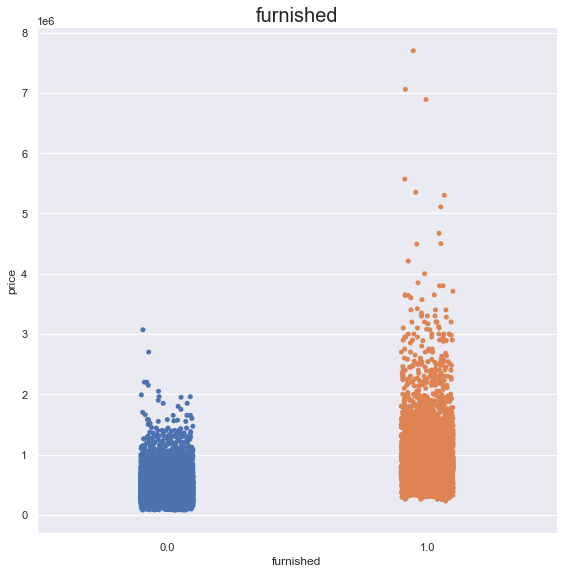

In [93]:
#Categorical scatter plot
sns.catplot(y='price', x=cat[col], data=df2, height=8, aspect=1)
plt.title(f"{cat[col]}", fontsize=20)
col+=1

### Observations
- The higher priced houses were furnished.

## Month that House was Sold

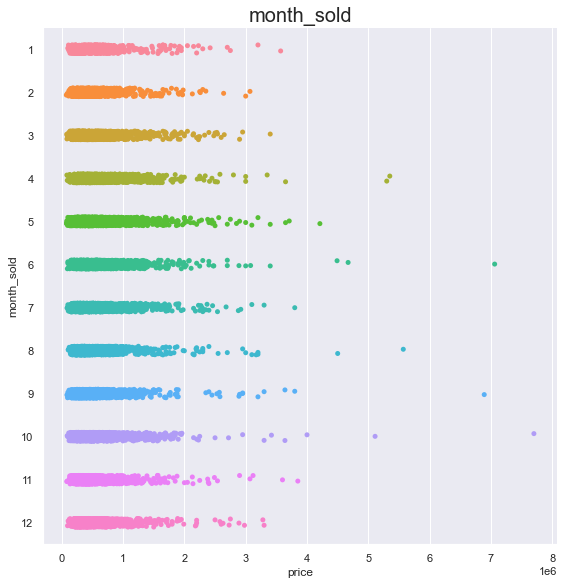

In [94]:
#Categorical scatter plot
sns.catplot(x='price',y=cat[col],data=df2, height=8, aspect=1)
plt.title(f"{cat[col]}", fontsize=20)
col+=1

### Observations
- Aside from some outliers, price seems mostly consistent across the different months.
- Focusing on the outliers, they are more common among the warmer months.

## Year that House was Sold

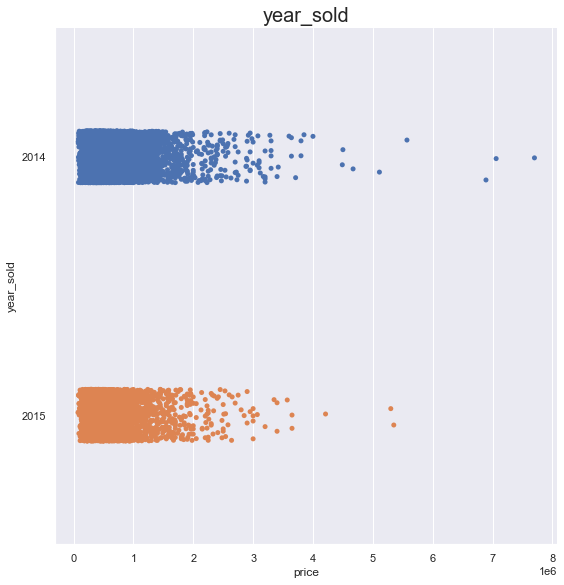

In [95]:
#Categorical scatter plot
sns.catplot(x='price',y=cat[col],data=df2, height=8, aspect=1)
plt.title(f"{cat[col]}", fontsize=20)
col+=1

### Observations
- Higher priced houses tended to be sold more in 2014 than 2015.

# EDA Conclusion
None of the continuous variables were normally distributed and this will cause issues for the linear regression model without any log transformations. Living measure, ceil measure, and living measure 15 looked like the best continuous variables to use to predict price. Furnshed, zipcode, quality, condition, ceil, yr_renovated, room_bath, and room_bed appear to be important categories when predicting price. Total_area will need to be dropped since it is perfectly correlated with lot_measure.
